In [1]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

In [2]:
os.chdir('./data/stocks')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


In [3]:
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['kmpr.us.txt', 'ogcp.us.txt', 'glv.us.txt', 'arc.us.txt', 'echo.us.txt', 'vntr.us.txt', 'fi.us.txt', 'habt.us.txt']


In [4]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])
    data.append(df)

In [5]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2011-08-26,22.435,22.497,20.752,20.863,580609,0,kmpr
1,2011-08-29,21.023,22.109,20.947,22.109,207974,0,kmpr
2,2011-08-30,21.948,22.007,21.441,21.881,175115,0,kmpr
3,2011-08-31,21.943,22.185,21.692,21.934,210105,0,kmpr
4,2011-09-01,21.989,22.109,21.374,21.400,119507,0,kmpr


In [6]:
print(len(data))

8


In [7]:
TechIndicator = copy.deepcopy(data)

# Calculation of Relative Strength Index (RSI)

Relative strength Index identifies the speed and change in the price movements. RSI index ranges between 0 to 100.

RSI>70 Stock = Overbought
RSI<30 Stock = Oversold

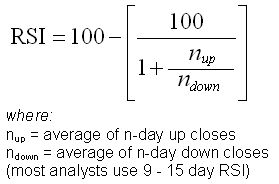

In [8]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)

In [9]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,2.591,78.007066
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,-0.897,68.208540
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,-1.096,62.782976
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,1.694,62.135079
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,0.240,61.995952


## Calculation of Volume Plain

1. Volume measures the number of shares traded in a stock or contracts traded in futures or options.

2. Volume can indicate market strength, as rising markets on increasing volume are typically viewed as strong and healthy.

3. When prices fall on increasing volume, the trend is gathering strength to the downside.

4. When prices reach new highs (or no lows) on decreasing volume, watch out—a reversal might be taking shape.

In [10]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,2.591,78.007066,440921
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,-0.897,68.208540,348622
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,-1.096,62.782976,245804
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,1.694,62.135079,214216
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,0.240,61.995952,150859


## Calculation of Bollinger Bands

Bollinger Bands are envelopes plotted at a standard deviation level above and below a simple moving average of the price. Because the distance of the bands is based on standard deviation, they adjust to volatility swings in the underlying price. Bollinger Bands use 2 parameters, Period and Standard Deviations

Three lines compose Bollinger Bands: A simple moving average, or the middle band, and an upper and lower band.

The upper and lower bands are typically 2 standard deviations +/- from a 20-day simple moving average and can be modified.

***When the price continually touches the upper Bollinger Band, it can indicate an overbought signal.***

***If the price continually touches the lower band it can indicate an oversold signal.***

In [11]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [12]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,2.591,78.007066,440921,60.105,63.414,56.796
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,-0.897,68.208540,348622,60.646,63.951,57.340
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,-1.096,62.782976,245804,61.136,64.260,58.013
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,1.694,62.135079,214216,61.640,64.753,58.526
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,0.240,61.995952,150859,62.117,65.222,59.013


## Calculation of Aroon Oscillator

The Aroon Oscillator uses Aroon Up and Aroon Down to create the oscillator.
Aroon Up and Aroon Down measure the number of periods since the last 25-period high and low.
The Aroon Oscillator crosses above the zero line when Aroon Up moves above Aroon Down. The oscillator drops below the zero line when the Aroon Down moves below the Aroon Up.

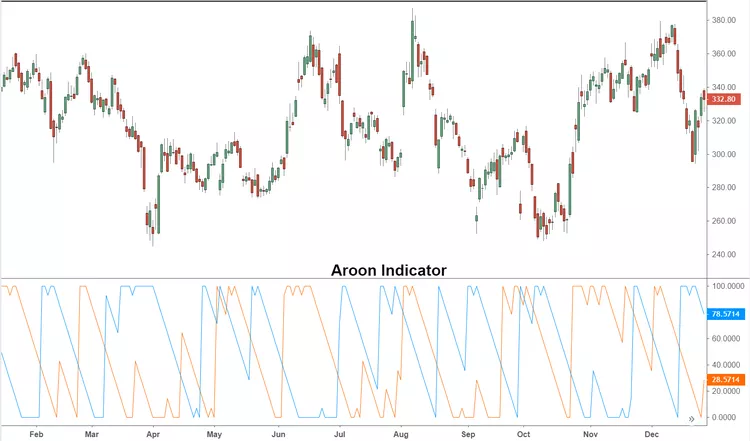

Aroon oscillator readings above zero indicate that an ***uptrend*** is present, while readings below zero indicate that a ***downtrend*** is present.

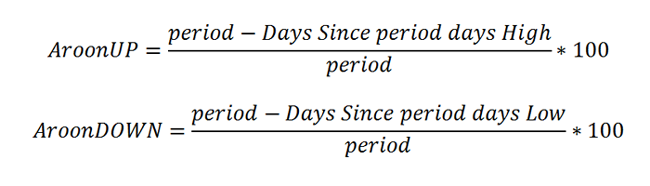
​
 
​


In [13]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [14]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list

# Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

The volume price trend (VPT) indicator helps determine a security’s price direction and strength of price change. The indicator consists of a cumulative volume line that adds or subtracts a multiple of the percentage change in a share price’s trend and current volume, depending upon the security’s upward or downward movements.

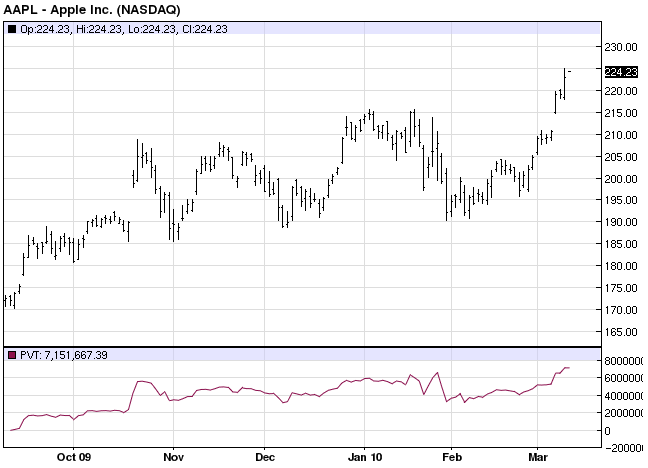

***Calculation***

The steps in the Price and Volume Trend calculation are:

1. Calculate the Percentage Change in closing price:
**( Closing Price [today] - Closing Price [yesterday] ) / Closing Price [yesterday]**

2. Multiply the Percentage Change by Volume:
**Percentage Change * Volume [today]**

3. Add to yesterday's cumulative total:
**Percentage Change * Volume [today] + PVT [yesterday]**


***Interpretation***

1. When the PVT falls money is flowing out of this market (falling prices accompanied by increased volume).
2. When the PVT rises money is flowing into this market (prices and volume are increasing together).

In [15]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,2.591,78.007066,440921,60.105,63.414,56.796,88.0,16214.486255
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,-0.897,68.208540,348622,60.646,63.951,57.340,88.0,-22522.713681
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,-1.096,62.782976,245804,61.136,64.260,58.013,88.0,594.639763
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,1.694,62.135079,214216,61.640,64.753,58.526,88.0,9708.242428
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,0.240,61.995952,150859,62.117,65.222,59.013,84.0,-5066.031517


# Calculation of Acceleration Bands

Acceleration Bands consist of three bands: an upper band, a lower band, and a midpoint. The midpoint is a simple moving average (SMA), typically calculated over a specified period, such as 20 days. The upper and lower bands are derived from the high and low prices of a financial instrument during the same period.

***1. Upper Band = SMA * (1 + (High - Low) / (SMA))***

***2.Lower Band = SMA * (1 - (High - Low) / (SMA))***

***Identifying Trends***

Acceleration Bands can help traders identify the direction of the market trend. When the price is above the midpoint, it indicates a bullish trend, while a price below the middle signals a bearish trend. A widening of the bands may suggest an increase in momentum, while a narrowing of the bands may indicate a potential trend reversal.

***Breakout Trading***

Breakout traders use Acceleration Bands to identify potential breakouts from a consolidation phase. When the price moves above the upper band or below the lower band, it may signify a breakout, signaling a possible entry or exit point for traders. The widening of the bands can also provide additional confirmation of the breakout, as it indicates an increase in volatility and momentum.

***Support and Resistance***

Acceleration Bands can also act as dynamic support and resistance levels. Depending on the market trend, the upper and lower bands can provide potential support or resistance. In a bullish trend, the lower band may serve as support, while the upper band may act as resistance in a bearish trend. Traders can use these levels to set stop-loss orders or profit targets.

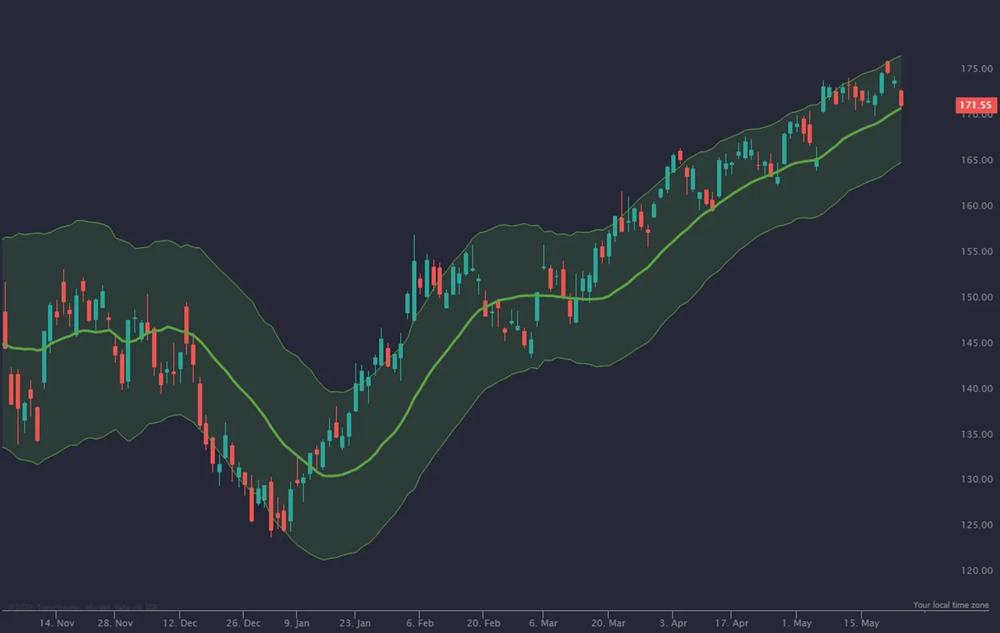

In [16]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [17]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,2.591,78.007066,...,60.105,63.414,56.796,88.0,16214.486255,60.10505,76.475501,63.821985,55.655501,56.182985
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,-0.897,68.208540,...,60.646,63.951,57.340,88.0,-22522.713681,60.64560,72.602379,64.631910,58.902379,56.482160
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,-1.096,62.782976,...,61.136,64.260,58.013,88.0,594.639763,61.13630,70.200781,65.304241,60.735781,56.867991
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,1.694,62.135079,...,61.640,64.753,58.526,88.0,9708.242428,61.63950,70.586441,65.752125,60.246441,57.420375
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,0.240,61.995952,...,62.117,65.222,59.013,84.0,-5066.031517,62.11730,68.459631,66.184753,64.459631,57.939503


# Drop unwanted columns

In [18]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2011-08-26,22.435,22.497,20.752,20.863,580609,0,kmpr,0.0,580609,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2011-08-29,21.023,22.109,20.947,22.109,207974,0,kmpr,0.0,207974,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2011-08-30,21.948,22.007,21.441,21.881,175115,0,kmpr,0.0,175115,0.0,0.0,0.0,0.0,-14226.702605,0.0,0.0,0.0
3,2011-08-31,21.943,22.185,21.692,21.934,210105,0,kmpr,0.0,210105,0.0,0.0,0.0,0.0,2314.795675,0.0,0.0,0.0
4,2011-09-01,21.989,22.109,21.374,21.400,119507,0,kmpr,0.0,119507,0.0,0.0,0.0,0.0,-3418.404098,0.0,0.0,0.0


# Calculation of Stochastic Oscillator (%K and %D)

A stochastic oscillator is a momentum indicator comparing a particular closing price of a security to a range of its prices over a certain period of time. The sensitivity of the oscillator to market movements is reducible by adjusting that time period or by taking a moving average of the result. It is used to generate overbought and oversold trading signals, utilizing a 0–100 bounded range of values.

Stochastic oscillators measure the momentum of an asset's price to determine trends and predict reversals.

Stochastic oscillators measure recent prices on a scale of 0 to 100, with measurements above 80 indicating that an asset is overbought and measurements below 20 indicating that it is oversold.

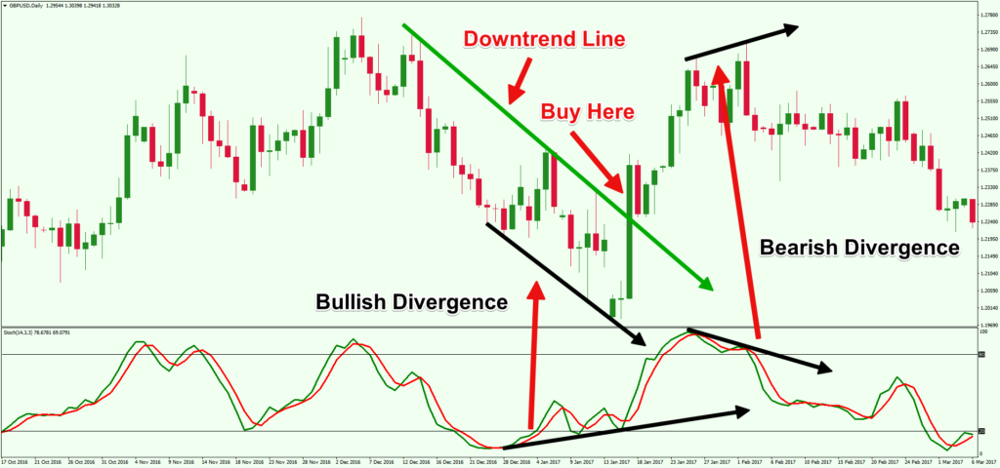

In [19]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [20]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,78.007066,440921,60.105,63.414,56.796,88.0,16214.486255,60.10505,63.821985,56.182985,64.657411,41.481592
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,68.208540,348622,60.646,63.951,57.340,88.0,-22522.713681,60.64560,64.631910,56.482160,45.245705,48.108931
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,62.782976,245804,61.136,64.260,58.013,88.0,594.639763,61.13630,65.304241,56.867991,16.635038,42.179385
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,62.135079,214216,61.640,64.753,58.526,88.0,9708.242428,61.63950,65.752125,57.420375,52.041306,37.974017
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,61.995952,150859,62.117,65.222,59.013,84.0,-5066.031517,62.11730,66.184753,57.939503,66.587591,45.087979


# Calculation of Chaikin Money Flow

Chaikin Money Flow (CMF) developed by Marc Chaikin is a volume-weighted average of accumulation and distribution over a specified period. The standard CMF period is 21 days. 

1. The principle behind the Chaikin Money Flow is the nearer the closing price is to the high, the more accumulation has taken place. Conversely, the nearer the closing price is to the low, the more distribution has taken place. 

2. If the price action consistently closes above the bar's midpoint on increasing volume, the Chaikin Money Flow will be positive.

3. If the price action consistently closes below the bar's midpoint on increasing volume, the Chaikin Money Flow will be a negative value.

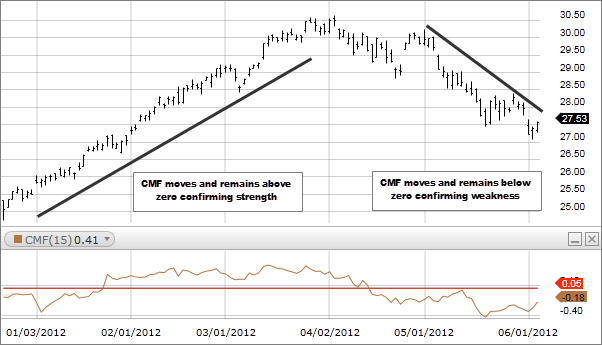

How this indicator works

1. A CMF value above the zero line is a sign of strength in the market, and a value below the zero line is a sign of weakness in the market.
Wait for the CMF to confirm the breakout direction of price action through trend lines or through support and resistance lines. For example, if a price breaks upward through resistance, wait for the CMF to have a positive value to confirm the breakout direction.

2. A CMF sell signal occurs when price action develops a higher high into overbought zones, with the CMF diverging with a lower high and beginning to fall.

3. A CMF buy signal occurs when price action develops a lower low into oversold zones, with the CMF diverging with a higher low and beginning to rise.

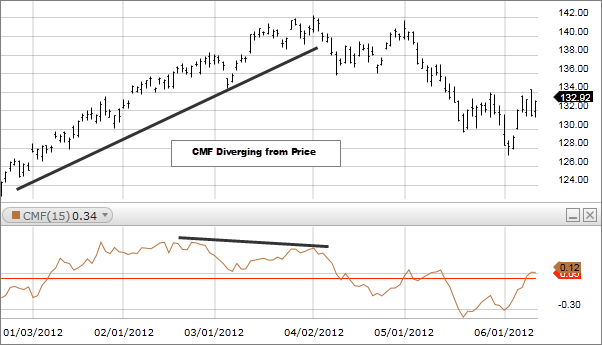

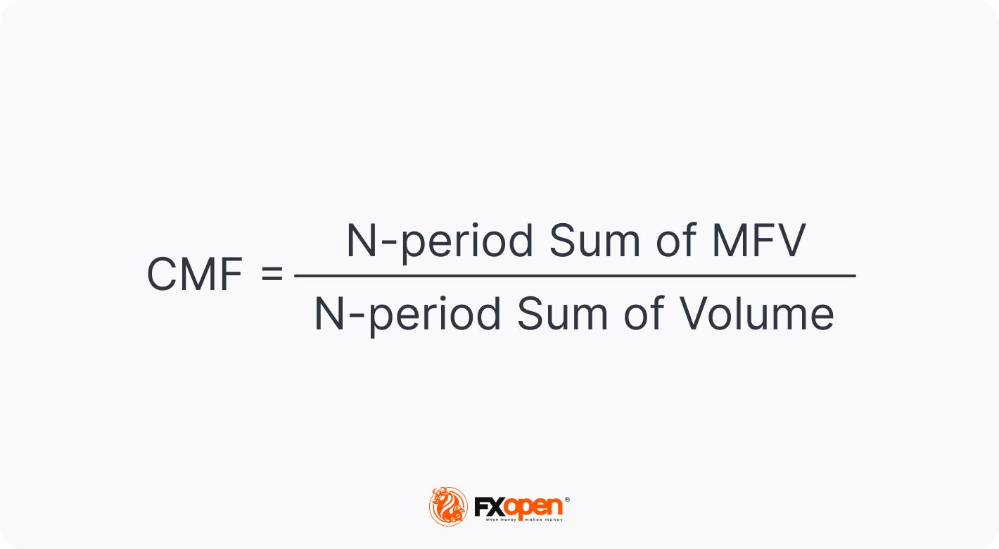

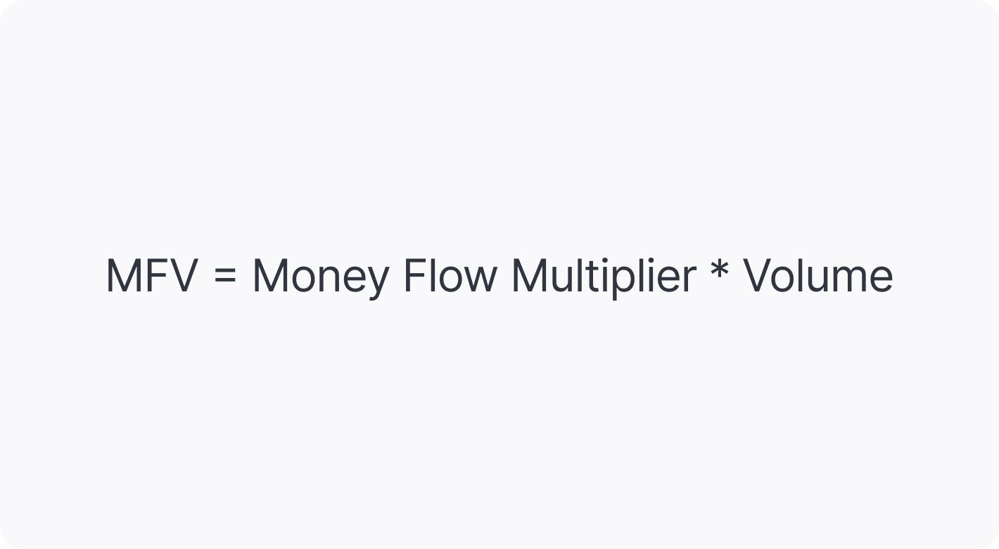

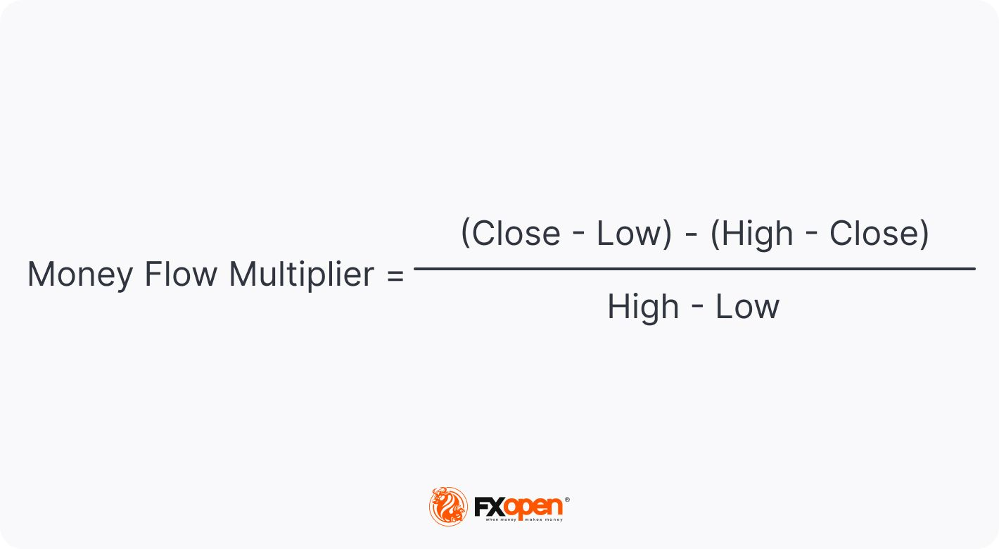

In [21]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [22]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

C:\Users\Paras\AppData\Local\Temp\ipykernel_23060\299586020.py:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
1559,2017-11-06,63.720,67.884,63.720,66.659,440921,0,kmpr,78.007066,440921,...,63.414,56.796,88.0,16214.486255,60.10505,63.821985,56.182985,64.657411,41.481592,1.358995
1560,2017-11-07,67.008,67.008,64.268,65.762,348622,0,kmpr,68.208540,348622,...,63.951,57.340,88.0,-22522.713681,60.64560,64.631910,56.482160,45.245705,48.108931,1.935507
1561,2017-11-08,65.314,66.360,64.467,64.666,245804,0,kmpr,62.782976,245804,...,64.260,58.013,88.0,594.639763,61.13630,65.304241,56.867991,16.635038,42.179385,1.254895
1562,2017-11-09,64.367,66.385,64.317,66.360,214216,0,kmpr,62.135079,214216,...,64.753,58.526,88.0,9708.242428,61.63950,65.752125,57.420375,52.041306,37.974017,0.564558
1563,2017-11-10,66.250,66.850,66.050,66.600,150859,0,kmpr,61.995952,150859,...,65.222,59.013,84.0,-5066.031517,62.11730,66.184753,57.939503,66.587591,45.087979,0.858803


# Calculation of Parabolic SAR

The indicator uses a trailing stop and reverse method called "SAR," or stop and reverse, to identify suitable exit and entry points. Traders also refer to the indicator as to the parabolic stop and reverse, parabolic SAR, or PSAR.

The parabolic SAR indicator appears on a chart as a series of dots, either above or below an asset's price, depending on the direction the price is moving. A dot is placed below the price when it is trending upward, and above the price when it is trending downward.

***The parabolic SAR (stop and reverse) indicator is used by technical traders to spot trends and reversals.***

***The indicator utilizes a system of dots superimposed onto a price chart. A reversal occurs when these dots flip, but a reversal signal in the SAR does not necessarily mean a reversal in the price. A PSAR reversal only means that the price and indicator have crossed.***

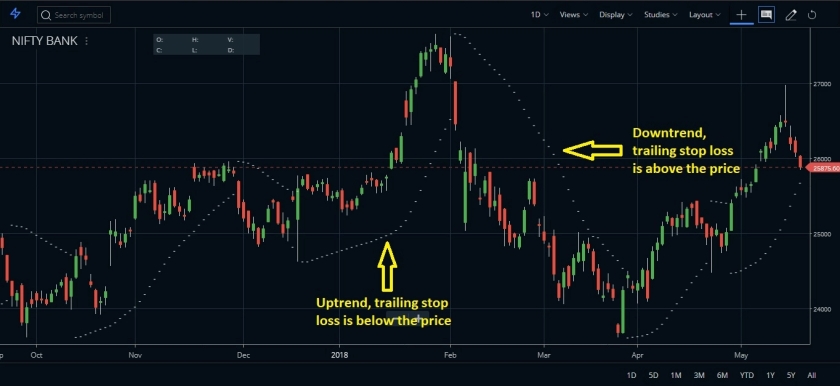

1. RPSAR=Prior PSAR + [Prior AF(Prior EP-Prior PSAR)]

2. FPSAR=Prior PSAR − [Prior AF(Prior PSAR-Prior EP)]

where:
1. RPSAR = Rising PSAR

2. AF = Acceleration Factor, it starts at 0.02 and increases by 0.02, up to a maximum of 0.2, eachtime the extreme point makes a new low (falling
SAR) or high(rising SAR)

3. FPSAR = Falling PSAR

4. EP = Extreme Point, the lowest low in the current downtrend(falling SAR)or the highest high in the current uptrend(rising SAR)
​





In [23]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [24]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
1559,2017-11-06,63.720,67.884,63.720,62.852261,440921,0,kmpr,78.007066,440921,...,56.796,88.0,16214.486255,60.10505,63.821985,56.182985,64.657411,41.481592,1.358995,62.852261
1560,2017-11-07,67.008,67.008,64.268,62.878000,348622,0,kmpr,68.208540,348622,...,57.340,88.0,-22522.713681,60.64560,64.631910,56.482160,45.245705,48.108931,1.935507,62.878000
1561,2017-11-08,65.314,66.360,64.467,63.720000,245804,0,kmpr,62.782976,245804,...,58.013,88.0,594.639763,61.13630,65.304241,56.867991,16.635038,42.179385,1.254895,63.720000
1562,2017-11-09,64.367,66.385,64.317,67.884000,214216,0,kmpr,62.135079,214216,...,58.526,88.0,9708.242428,61.63950,65.752125,57.420375,52.041306,37.974017,0.564558,67.884000
1563,2017-11-10,66.250,66.850,66.050,67.812660,150859,0,kmpr,61.995952,150859,...,59.013,84.0,-5066.031517,62.11730,66.184753,57.939503,66.587591,45.087979,0.858803,67.812660


# Calculation of Price Rate of Change

The Price Rate of Change (ROC) oscillator is an unbounded momentum indicator used in technical analysis set against a zero-level midpoint.

A rising ROC above zero typically confirms an uptrend while a falling ROC below zero indicates a downtrend.

When the price is consolidating, the ROC will hover near zero. In this case, it is important traders watch the overall price trend since the ROC will provide little insight except for confirming the consolidation.

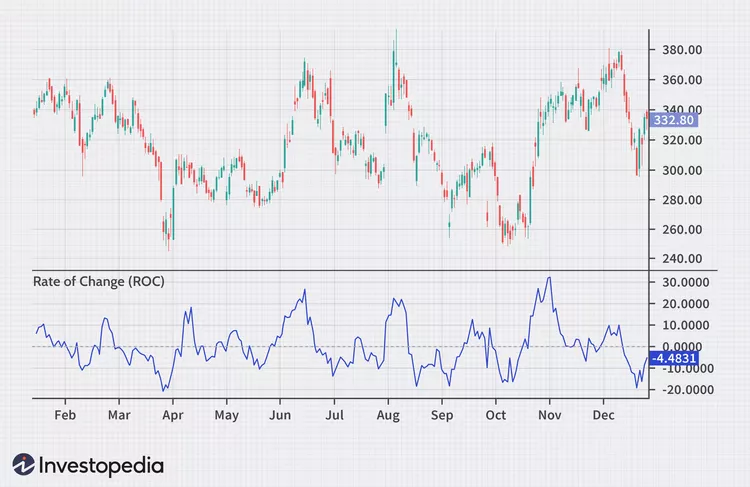

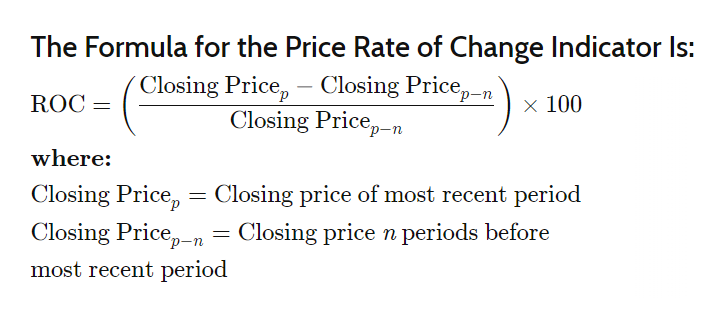

In [25]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
1559,2017-11-06,63.720,67.884,63.720,62.852261,440921,0,kmpr,78.007066,440921,...,88.0,16214.486255,60.10505,63.821985,56.182985,64.657411,41.481592,1.358995,62.852261,14.586360
1560,2017-11-07,67.008,67.008,64.268,62.878000,348622,0,kmpr,68.208540,348622,...,88.0,-22522.713681,60.64560,64.631910,56.482160,45.245705,48.108931,1.935507,62.878000,13.581043
1561,2017-11-08,65.314,66.360,64.467,63.720000,245804,0,kmpr,62.782976,245804,...,88.0,594.639763,61.13630,65.304241,56.867991,16.635038,42.179385,1.254895,63.720000,14.158910
1562,2017-11-09,64.367,66.385,64.317,67.884000,214216,0,kmpr,62.135079,214216,...,88.0,9708.242428,61.63950,65.752125,57.420375,52.041306,37.974017,0.564558,67.884000,20.728730
1563,2017-11-10,66.250,66.850,66.050,67.812660,150859,0,kmpr,61.995952,150859,...,84.0,-5066.031517,62.11730,66.184753,57.939503,66.587591,45.087979,0.858803,67.812660,19.592818


# Calculation of Volume Weighted Average Price

The volume-weighted average price (VWAP) appears as a single line on intraday charts.

It looks similar to a moving average line, but smoother.

VWAP represents a view of price action throughout a single day's trading session.

Retail and professional traders may use the VWAP to help them determine intraday price trends.
VWAP typically is most useful to short-term traders.

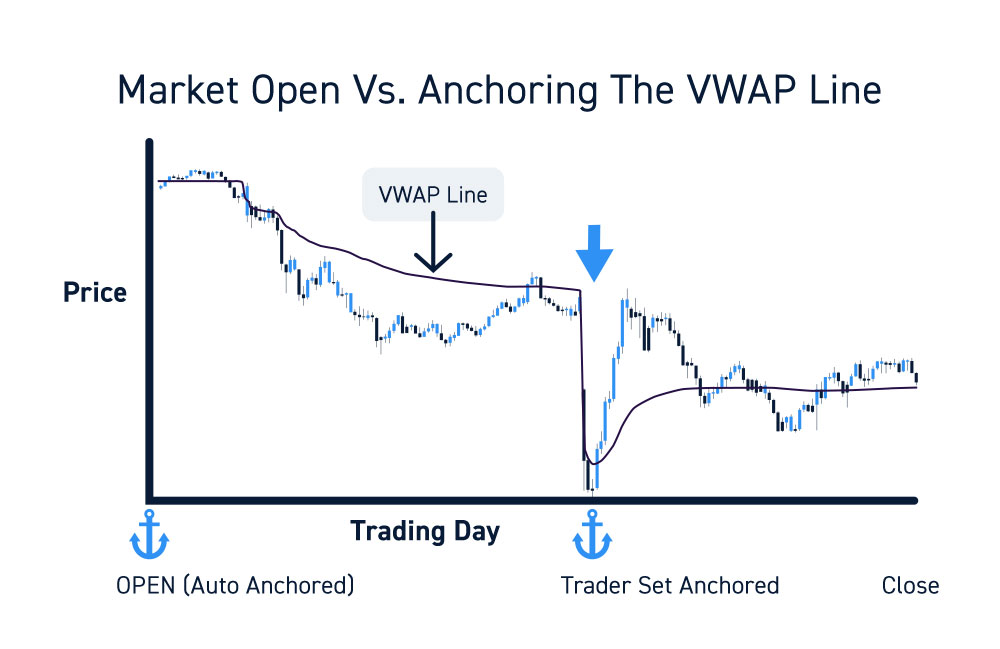

In [26]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
1559,2017-11-06,63.720,67.884,63.720,62.852261,440921,0,kmpr,78.007066,440921,...,16214.486255,60.10505,63.821985,56.182985,64.657411,41.481592,1.358995,62.852261,14.586360,33.021478
1560,2017-11-07,67.008,67.008,64.268,62.878000,348622,0,kmpr,68.208540,348622,...,-22522.713681,60.64560,64.631910,56.482160,45.245705,48.108931,1.935507,62.878000,13.581043,33.065840
1561,2017-11-08,65.314,66.360,64.467,63.720000,245804,0,kmpr,62.782976,245804,...,594.639763,61.13630,65.304241,56.867991,16.635038,42.179385,1.254895,63.720000,14.158910,33.096831
1562,2017-11-09,64.367,66.385,64.317,67.884000,214216,0,kmpr,62.135079,214216,...,9708.242428,61.63950,65.752125,57.420375,52.041306,37.974017,0.564558,67.884000,20.728730,33.123739
1563,2017-11-10,66.250,66.850,66.050,67.812660,150859,0,kmpr,61.995952,150859,...,-5066.031517,62.11730,66.184753,57.939503,66.587591,45.087979,0.858803,67.812660,19.592818,33.143307


# Calculation of Momentum

Momentrum indicators are technical analysis tools used to determine the strength or weakness of a stock's price. Momentum measures the rate of the rise or fall of stock prices. Common momentum indicators include the relative strength index (RSI) and moving average convergence divergence (MACD).

In [27]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
1559,2017-11-06,63.720,67.884,63.720,62.852261,440921,0,kmpr,78.007066,440921,...,60.10505,63.821985,56.182985,64.657411,41.481592,1.358995,62.852261,14.586360,33.021478,3.341975
1560,2017-11-07,67.008,67.008,64.268,62.878000,348622,0,kmpr,68.208540,348622,...,60.64560,64.631910,56.482160,45.245705,48.108931,1.935507,62.878000,13.581043,33.065840,2.276771
1561,2017-11-08,65.314,66.360,64.467,63.720000,245804,0,kmpr,62.782976,245804,...,61.13630,65.304241,56.867991,16.635038,42.179385,1.254895,63.720000,14.158910,33.096831,2.196217
1562,2017-11-09,64.367,66.385,64.317,67.884000,214216,0,kmpr,62.135079,214216,...,61.63950,65.752125,57.420375,52.041306,37.974017,0.564558,67.884000,20.728730,33.123739,5.622174
1563,2017-11-10,66.250,66.850,66.050,67.812660,150859,0,kmpr,61.995952,150859,...,62.11730,66.184753,57.939503,66.587591,45.087979,0.858803,67.812660,19.592818,33.143307,4.960399


# Calculation of Commodity Channel Index

The Commodity Channel Index (CCI) is a technical indicator that measures the difference between the current price and the historical average price.
When the CCI is above zero, it indicates the price is above the historic average. Conversely, when the CCI is below zero, the price is below the historic average.
The CCI is an unbounded oscillator, meaning it can go higher or lower indefinitely. For this reason, overbought and oversold levels are typically determined for each individual asset by looking at historical extreme CCI levels where the price reversed from.

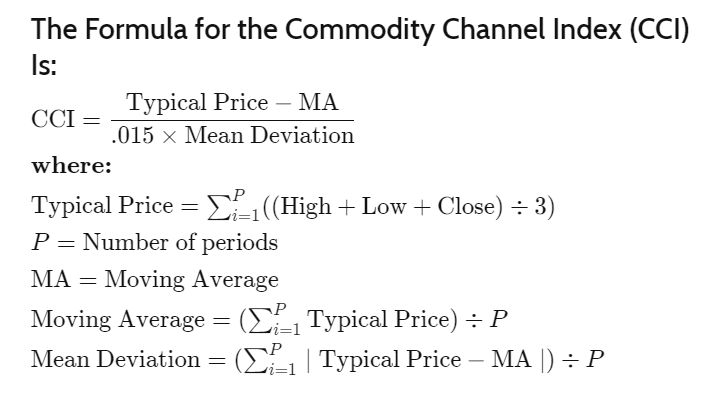

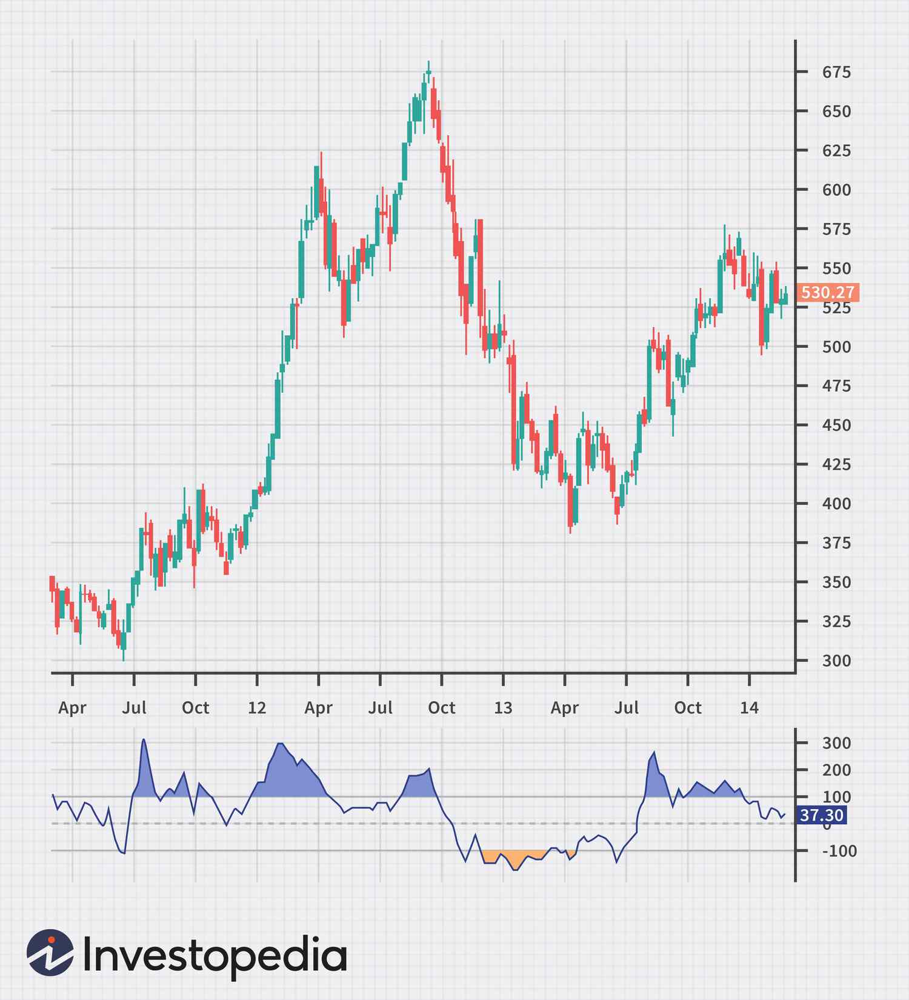

In [28]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [29]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
1559,2017-11-06,63.720,67.884,63.720,62.852261,440921,0,kmpr,78.007066,440921,...,63.821985,56.182985,64.657411,41.481592,1.358995,62.852261,14.586360,33.021478,3.341975,124.826927
1560,2017-11-07,67.008,67.008,64.268,62.878000,348622,0,kmpr,68.208540,348622,...,64.631910,56.482160,45.245705,48.108931,1.935507,62.878000,13.581043,33.065840,2.276771,109.667489
1561,2017-11-08,65.314,66.360,64.467,63.720000,245804,0,kmpr,62.782976,245804,...,65.304241,56.867991,16.635038,42.179385,1.254895,63.720000,14.158910,33.096831,2.196217,101.709265
1562,2017-11-09,64.367,66.385,64.317,67.884000,214216,0,kmpr,62.135079,214216,...,65.752125,57.420375,52.041306,37.974017,0.564558,67.884000,20.728730,33.123739,5.622174,115.341467
1563,2017-11-10,66.250,66.850,66.050,67.812660,150859,0,kmpr,61.995952,150859,...,66.184753,57.939503,66.587591,45.087979,0.858803,67.812660,19.592818,33.143307,4.960399,114.805379


# Calculation of On Balance Volume

If the closing price is above the prior close price then: Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: Current OBV = Previous OBV - Current Volume

If the closing prices equals the prior close price then: Current OBV = Previous OBV (no change)

In [30]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
66,2017-11-06,23.69,23.69,22.62,26.502510,926905,0,vntr,42.578125,926905,...,22.459382,-33.716475,-22.896734,-0.785061,26.502510,14.124208,21.861038,-0.397490,-4.422927,18932869
67,2017-11-07,22.96,22.96,22.19,26.191910,815489,0,vntr,43.339960,815489,...,22.389679,-24.304248,-29.937544,-1.783810,26.191910,11.867833,21.871532,-0.658090,-51.569258,18117380
68,2017-11-08,22.34,22.69,21.77,25.791719,949560,0,vntr,42.365353,949560,...,22.326188,-4.055424,-20.692049,-2.189110,25.791719,9.705311,21.877564,-1.009281,-87.908535,17167820
69,2017-11-09,22.38,23.14,22.26,25.309112,696832,0,vntr,44.521646,696832,...,22.214015,29.166667,0.268998,-2.528171,25.309112,7.060543,21.887596,-1.385048,-73.088855,16470988
70,2017-11-10,22.63,23.14,22.56,24.884419,925866,0,vntr,42.027367,925866,...,22.138606,51.459854,25.523699,-1.980245,24.884419,4.820636,21.902945,-1.618092,-75.294806,15545122


# Calcualtion of Keltner Channels

Keltner Channels are volatility-based bands that are placed on either side of an asset's price and can aid in determining the direction of a trend.
The exponential moving average (EMA) of a Keltner Channel is typically 20 periods, although this can be adjusted if desired.

***The upper and lower bands are typically set two times the average true range (ATR) above and below the EMA, although the multiplier can also be adjusted based on personal preference.***

Price reaching the upper Keltner Channel band is ***bullish***, while reaching the lower band is ***bearish***.

The angle of the Keltner Channel also aids in identifying the trend direction. The price may also oscillate between the upper and lower Keltner Channel bands, which can be interpreted as resistance and support levels.

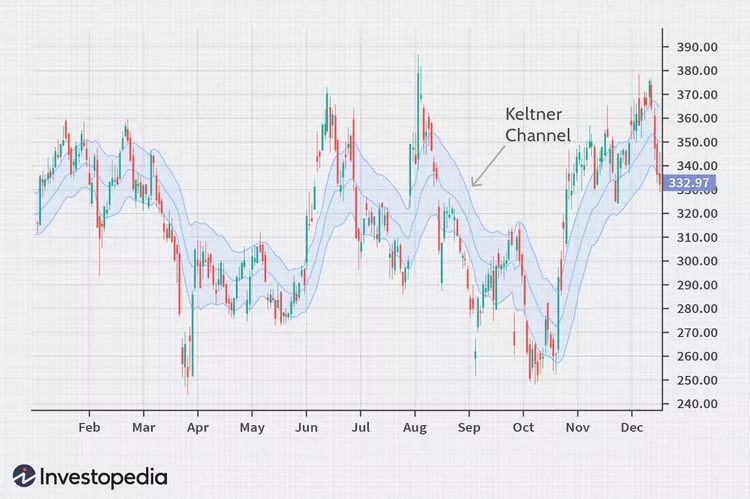

In [31]:
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [32]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
66,2017-11-06,23.69,23.69,22.62,26.502510,926905,0,vntr,42.578125,926905,...,-0.785061,26.502510,14.124208,21.861038,-0.397490,-4.422927,18932869,25.525029,24.657379,23.789729
67,2017-11-07,22.96,22.96,22.19,26.191910,815489,0,vntr,43.339960,815489,...,-1.783810,26.191910,11.867833,21.871532,-0.658090,-51.569258,18117380,25.491728,24.646220,23.800713
68,2017-11-08,22.34,22.69,21.77,25.791719,949560,0,vntr,42.365353,949560,...,-2.189110,25.791719,9.705311,21.877564,-1.009281,-87.908535,17167820,25.506232,24.633582,23.760932
69,2017-11-09,22.38,23.14,22.26,25.309112,696832,0,vntr,44.521646,696832,...,-2.528171,25.309112,7.060543,21.887596,-1.385048,-73.088855,16470988,25.514229,24.620150,23.726072
70,2017-11-10,22.63,23.14,22.56,24.884419,925866,0,vntr,42.027367,925866,...,-1.980245,24.884419,4.820636,21.902945,-1.618092,-75.294806,15545122,25.483144,24.594779,23.706415


# Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3EMA – 3EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

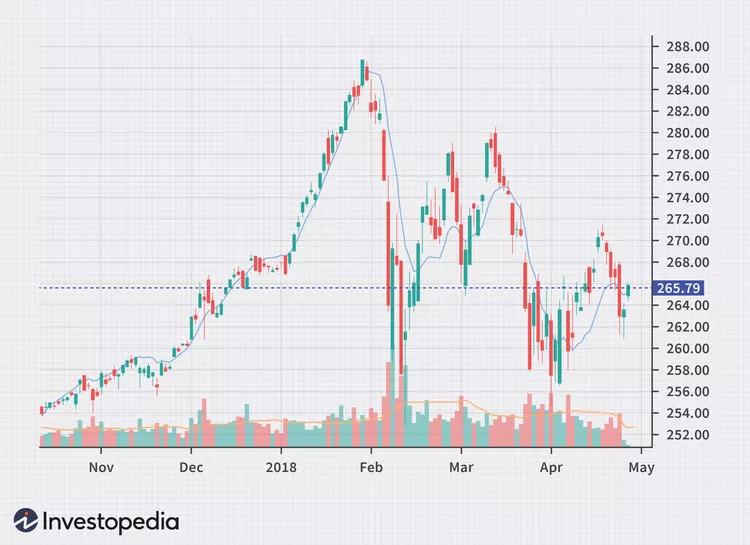

In [33]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
66,2017-11-06,23.69,23.69,22.62,26.502510,926905,0,vntr,42.578125,926905,...,14.124208,21.861038,-0.397490,-4.422927,18932869,25.525029,24.657379,23.789729,26.588379,16755.377999
67,2017-11-07,22.96,22.96,22.19,26.191910,815489,0,vntr,43.339960,815489,...,11.867833,21.871532,-0.658090,-51.569258,18117380,25.491728,24.646220,23.800713,26.390144,16368.995586
68,2017-11-08,22.34,22.69,21.77,25.791719,949560,0,vntr,42.365353,949560,...,9.705311,21.877564,-1.009281,-87.908535,17167820,25.506232,24.633582,23.760932,26.090931,15797.117222
69,2017-11-09,22.38,23.14,22.26,25.309112,696832,0,vntr,44.521646,696832,...,7.060543,21.887596,-1.385048,-73.088855,16470988,25.514229,24.620150,23.726072,25.700022,15070.263042
70,2017-11-10,22.63,23.14,22.56,24.884419,925866,0,vntr,42.027367,925866,...,4.820636,21.902945,-1.618092,-75.294806,15545122,25.483144,24.594779,23.706415,25.292220,14336.130057


# Calculation of Normalized Average True Range
True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 

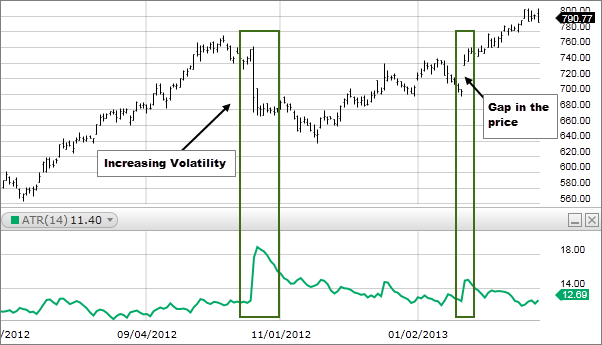

### How this indicator works
1. An expanding ATR indicates increased volatility in the market, with the range of each bar getting larger. A reversal in price with an increase in ATR would indicate strength behind that move. ATR is not directional so an expanding ATR can indicate selling pressure or buying pressure. High ATR values usually result from a sharp advance or decline and are unlikely to be sustained for extended periods.

2. A low ATR value indicates a series of periods with small ranges (quiet days). These low ATR values are found during extended sideways price action, thus the lower volatility. A prolonged period of low ATR values may indicate a consolidation area and the possibility of a continuation move or reversal.

3. ATR is very useful for stops or entry triggers, signaling changes in volatility. Whereas fixed dollar- point or percentage stops will not allow for volatility, the ATR stop will adapt to sharp price moves or consolidation areas, which can trigger an abnormal price movement in either direction. Use a multiple of ATR, such as 1.5 x ATR, to catch these abnormal price moves.

In [34]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
66,2017-11-06,23.69,23.69,22.62,26.502510,926905,0,vntr,42.578125,926905,...,24.657379,23.789729,26.588379,16755.377999,1.07,3.004160,4.074160,4.074160,2.031524,7.665401
67,2017-11-07,22.96,22.96,22.19,26.191910,815489,0,vntr,43.339960,815489,...,24.646220,23.800713,26.390144,16368.995586,0.77,3.542510,4.312510,4.312510,2.184923,8.341977
68,2017-11-08,22.34,22.69,21.77,25.791719,949560,0,vntr,42.365353,949560,...,24.633582,23.760932,26.090931,15797.117222,0.92,3.501910,4.421910,4.421910,2.426529,9.408170
69,2017-11-09,22.38,23.14,22.26,25.309112,696832,0,vntr,44.521646,696832,...,24.620150,23.726072,25.700022,15070.263042,0.88,2.651719,3.531719,3.531719,2.607545,10.302793
70,2017-11-10,22.63,23.14,22.56,24.884419,925866,0,vntr,42.027367,925866,...,24.594779,23.706415,25.292220,14336.130057,0.58,2.169112,2.749112,2.749112,2.733429,10.984501


# Calculation of Average Directional Movement Index (ADX)

the ADX is now used in several markets by technical traders to judge the strength of a trend. The ADX makes use of a positive (+DI) and negative (-DI) directional indicator in addition to the trendline.

The trend has strength when ADX is above 25; the trend is weak or the price is trendless when ADX is below 20, according to Wilder.

Non-trending doesn't mean the price isn't moving. It may not be, but the price could also be making a trend change or is too volatile for a clear direction to be present.

Calculating the DMI can actually be broken down into two parts. First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). +DM and -DM are calculated using the High, Low and Close for each period. You can then calculate the following:

Current High - Previous High = UpMove Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0 If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range) -DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

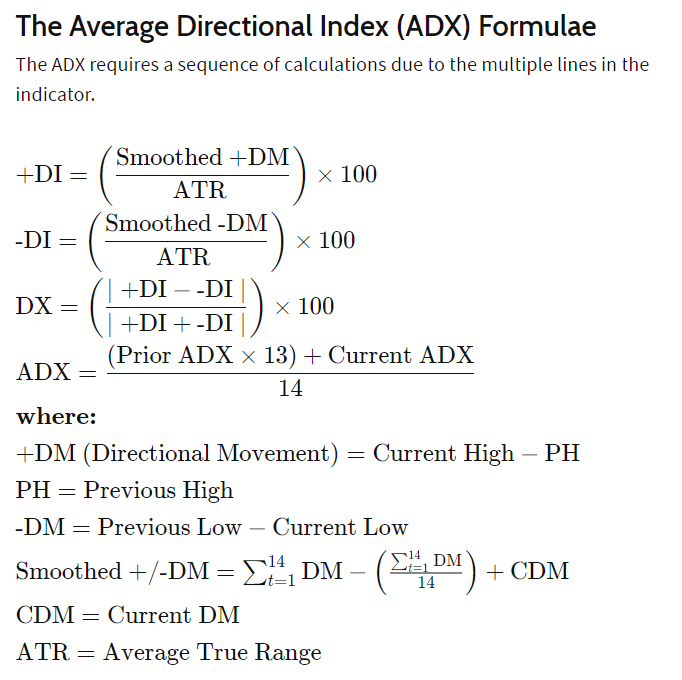

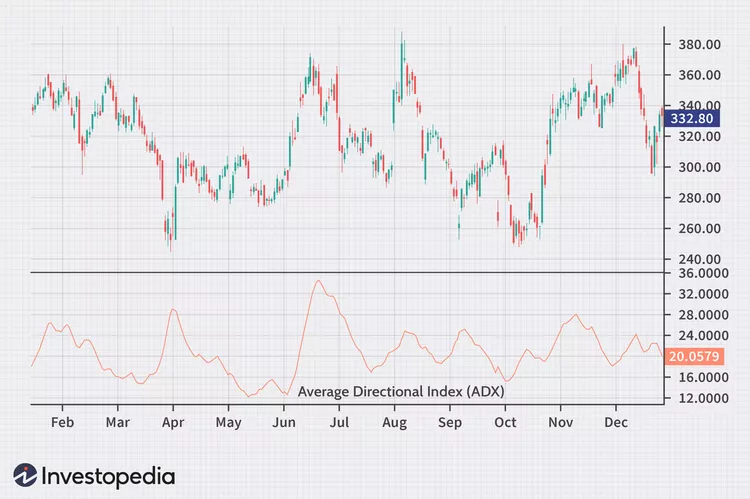

In [35]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

In [36]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
66,2017-11-06,23.69,23.69,22.62,26.502510,926905,0,vntr,42.578125,926905,...,2.031524,7.665401,-1.039,0.88,0,0.00,0.88,10.358928,14.872687,39.852440
67,2017-11-07,22.96,22.96,22.19,26.191910,815489,0,vntr,43.339960,815489,...,2.184923,8.341977,-0.730,0.43,0,0.00,0.43,8.977210,15.513951,38.096805
68,2017-11-08,22.34,22.69,21.77,25.791719,949560,0,vntr,42.365353,949560,...,2.426529,9.408170,-0.270,0.42,0,0.00,0.42,7.779852,15.753327,37.534624
69,2017-11-09,22.38,23.14,22.26,25.309112,696832,0,vntr,44.521646,696832,...,2.607545,10.302793,0.450,-0.49,0,0.45,0.00,9.043916,13.652280,35.236624
70,2017-11-10,22.63,23.14,22.56,24.884419,925866,0,vntr,42.027367,925866,...,2.733429,10.984501,0.000,-0.30,0,0.00,0.00,7.837760,11.831524,33.245189


# Drop Unwanted Columns

In [37]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2005-02-25,10.989,11.358,10.946,11.331,35111,0,glv,0.0,35111,...,0.0,35111,0.0,0.0,0.0,1103.623095,0.0,0.0,0.0,0.0
1,2005-02-28,11.331,11.378,11.146,11.227,30760,0,glv,0.0,30760,...,0.0,4351,0.0,0.0,0.0,1081.572000,0.0,0.0,0.0,0.0
2,2005-03-01,11.227,11.551,10.971,11.358,120983,0,glv,0.0,120983,...,0.0,125334,0.0,0.0,0.0,1099.055293,0.0,0.0,0.0,0.0
3,2005-03-02,11.551,11.551,11.196,10.971,92484,0,glv,0.0,92484,...,0.0,32850,0.0,0.0,0.0,1041.227681,0.0,0.0,0.0,0.0
4,2005-03-03,11.190,11.190,11.067,10.971,61534,0,glv,0.0,61534,...,0.0,-28684,0.0,0.0,0.0,1015.791693,0.0,0.0,0.0,0.0


# Calculation of MACD
MACD: (12-day EMA - 26-day EMA)

The moving average convergence/divergence (MACD, or MAC-D) line is calculated by subtracting the 26-period exponential moving average (EMA) from the 12-period EMA. The signal line is a nine-period EMA of the MACD line.

MACD is best used with daily periods, where the traditional settings of 26/12/9 days is the norm.

MACD triggers technical signals when the MACD line crosses above the signal line (to buy) or falls below it (to sell).

MACD can help gauge whether a security is overbought or oversold, alerting traders to the strength of a directional move, and warning of a potential price reversal.

MACD can also alert investors to bullish/bearish divergences (e.g., when a new high in price is not confirmed by a new high in MACD, and vice versa), suggesting a potential failure and reversal.

After a signal line crossover, it is recommended to wait for three or four days to confirm that it is not a false move.

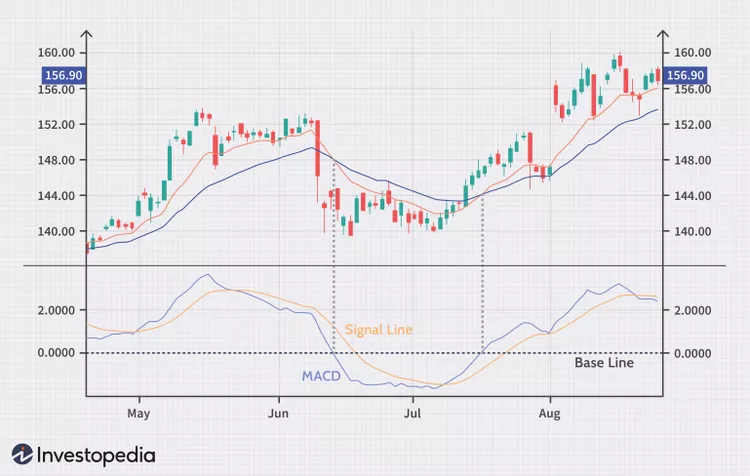

MACD is often displayed with a histogram (see the chart below) that graphs the distance between MACD and its signal line. If MACD is above the signal line, the histogram will be above the MACD’s baseline, or zero line. If MACD is below its signal line, the histogram will be below the MACD’s baseline. Traders use the MACD’s histogram to identify when bullish or bearish momentum is high—and possibly overbought/oversold.

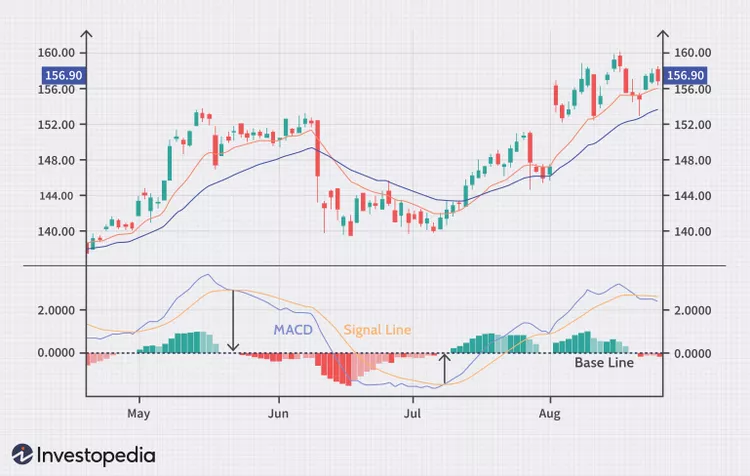

In [38]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
3196,2017-11-06,14.15,14.35,14.1500,13.939407,27423,0,glv,54.121864,27423,...,14.058360,13.908060,2166.902108,2.289416,14.259676,6.856062,23.358013,13.881815,13.945566,0.063751
3197,2017-11-07,14.29,14.30,14.2703,13.955830,17168,0,glv,59.109312,17168,...,14.071371,13.924235,2171.289095,2.273127,12.358386,5.941920,24.918554,13.887297,13.947145,0.059848
3198,2017-11-08,14.32,14.39,14.2900,13.971597,22381,0,glv,60.314342,22381,...,14.083243,13.939679,2177.454314,2.249009,14.529550,5.149664,27.951270,13.893542,13.950907,0.057365
3199,2017-11-09,14.22,14.38,14.1900,13.996701,36526,0,glv,58.034026,36526,...,14.091791,13.940370,2186.877576,2.240578,12.592277,8.714647,26.650957,13.901183,13.957952,0.056769
3200,2017-11-10,14.26,14.32,14.2400,14.020299,24764,0,glv,56.433824,24764,...,14.102581,13.956817,2197.575264,2.222431,10.913307,7.552694,25.524018,13.910007,13.967544,0.057537


# Calculation of Money Flow Index
Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
If typical price is unchanged then that day is discarded.
Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

1. The Money Flow Index (MFI) is a technical indicator that generates overbought or oversold signals using both prices and volume data.
2. An MFI reading above 80 is considered overbought and an MFI reading below 20 is considered oversold,although levels of 90 and 10 are also used as thresholds.
3. A divergence between the indicator and price is noteworthy. For example, if the indicator is rising while the price is falling or flat, the price could start rising.

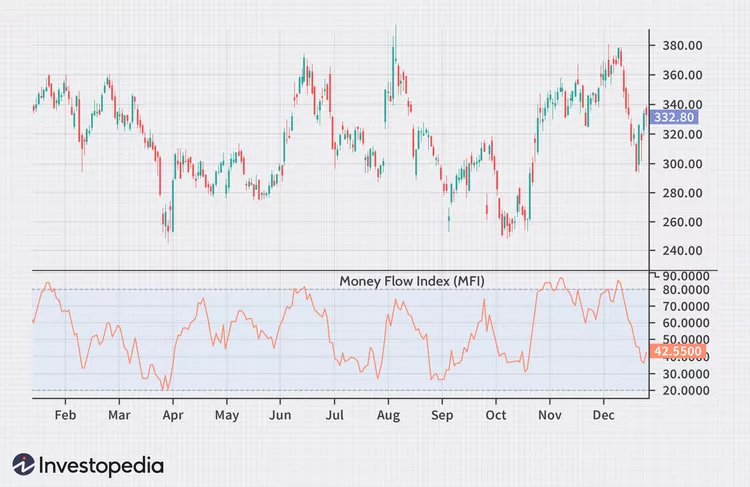

In [39]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [40]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
3196,2017-11-06,14.15,14.35,14.1500,13.939407,27423,0,glv,54.121864,27423,...,23.358013,13.881815,13.945566,0.063751,14.146469,387938.616096,14.146469,0.0000,1.804133,64.338356
3197,2017-11-07,14.29,14.30,14.2703,13.955830,17168,0,glv,59.109312,17168,...,24.918554,13.887297,13.947145,0.059848,14.175377,243362.868756,14.175377,0.0000,1.806728,64.371330
3198,2017-11-08,14.32,14.39,14.2900,13.971597,22381,0,glv,60.314342,22381,...,27.951270,13.893542,13.950907,0.057365,14.217199,318195.132008,14.217199,0.0000,1.809096,64.401364
3199,2017-11-09,14.22,14.38,14.1900,13.996701,36526,0,glv,58.034026,36526,...,26.650957,13.901183,13.957952,0.056769,14.188900,518263.777591,0.000000,14.1889,1.338135,57.230878
3200,2017-11-10,14.26,14.32,14.2400,14.020299,24764,0,glv,56.433824,24764,...,25.524018,13.910007,13.967544,0.057537,14.193433,351486.176876,14.193433,0.0000,1.807093,64.375963


# Calculations of Ichimoku Cloud
Turning Line = ( Highest High + Lowest Low ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span 2

The Ichimoku Cloud is a type of chart used in technical analysis to display support and resistance, momentum, and trend in one view. TenkanSen and KijunSen are similar to moving averages and analyzed in relationship to one another. When the shorter term indicator, TenkanSen, rises above the longer term indicator, KijunSen, the securities trend is typically positive. When TenkanSen falls below KijunSen, the securities trend is typically negative. TenkanSen and KijunSen as a group are then analyzed in relationship to the Cloud, which is composed of the area between Senkou A and Senkou B.

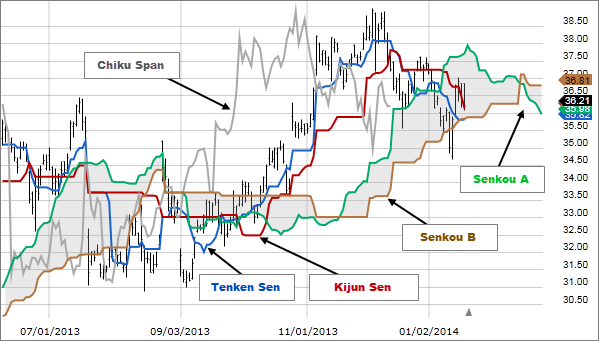

***1.When TenkanSen and KijunSen are decidedly above the Cloud, the issue's trend is positive.***

***2.When TenkanSen and KijunSen are decidedly below the Cloud, the issue's trend is negative.***

***Using the Cloud to determine trend:***
1. When prices are above the cloud, the trend is up. When prices are below the cloud, the trend is down.
When Sendou A is rising and above Senkou B, the uptrend is strengthening. When Senkou A is falling and below Senkou B, the downtrend is strengthening.
2. A buy signal is reinforced when the Tenkan Sen crosses above the Kijun Sen while the Tenkan Sen, Kijun Sen, and price are all above the cloud.
3. A sell signal is reinforced when the TenKan Sen crosses below the Kijun Sen while the Tenkan Sen, Kijun Sen, and price are all below the cloud.

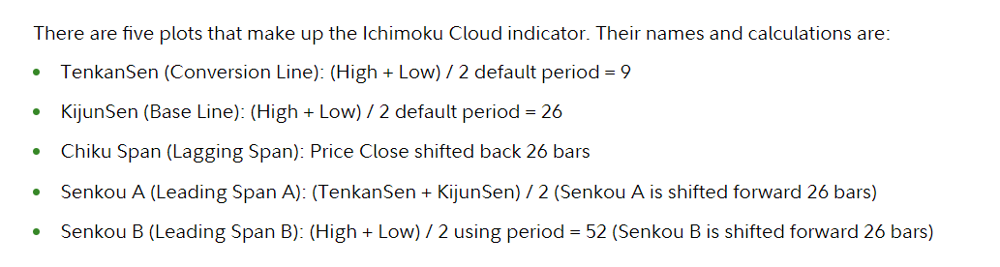

In [41]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [42]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
3196,2017-11-06,14.15,14.35,14.1500,13.939407,27423,0,glv,54.121864,27423,...,387938.616096,14.146469,0.0000,1.804133,64.338356,14.135,14.0515,13.79375,13.6535,0.0
3197,2017-11-07,14.29,14.30,14.2703,13.955830,17168,0,glv,59.109312,17168,...,243362.868756,14.175377,0.0000,1.806728,64.371330,14.135,14.0715,13.77650,13.6535,0.0
3198,2017-11-08,14.32,14.39,14.2900,13.971597,22381,0,glv,60.314342,22381,...,318195.132008,14.217199,0.0000,1.809096,64.401364,14.155,14.0915,13.77625,13.6535,0.0
3199,2017-11-09,14.22,14.38,14.1900,13.996701,36526,0,glv,58.034026,36526,...,518263.777591,0.000000,14.1889,1.338135,57.230878,14.155,14.0915,13.77875,13.6535,0.0
3200,2017-11-10,14.26,14.32,14.2400,14.020299,24764,0,glv,56.433824,24764,...,351486.176876,14.193433,0.0000,1.807093,64.375963,14.170,14.0915,13.78300,13.6535,0.0


# Calculation of William %R
%R = -100 * ( ( Highest High - Close) / ( Highest High - Lowest Low ) )

Williams %R moves between zero and -100.
1.  A reading above -20 is overbought.
2. A reading below -80 is oversold.
3. An overbought or oversold reading doesn't mean the price will reverse. Overbought simply means the price is near the highs of its recent range, and oversold means the price is in the lower end of its recent range.
4. Can be used to generate trade signals when the price and the indicator move out of overbought or oversold territory.

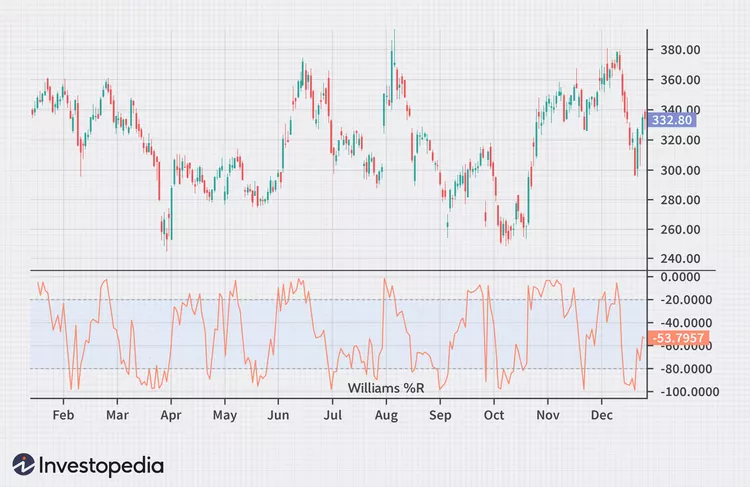

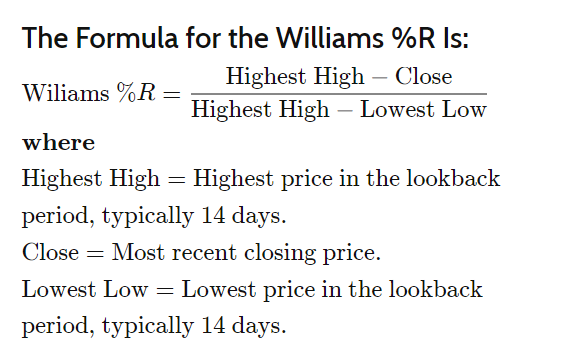

In [43]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))

In [44]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
3196,2017-11-06,14.15,14.35,14.1500,13.939407,27423,0,glv,54.121864,27423,...,14.146469,0.0000,1.804133,64.338356,14.135,14.0515,13.79375,13.6535,0.0,-95.486828
3197,2017-11-07,14.29,14.30,14.2703,13.955830,17168,0,glv,59.109312,17168,...,14.175377,0.0000,1.806728,64.371330,14.135,14.0715,13.77650,13.6535,0.0,-91.667355
3198,2017-11-08,14.32,14.39,14.2900,13.971597,22381,0,glv,60.314342,22381,...,14.217199,0.0000,1.809096,64.401364,14.155,14.0915,13.77625,13.6535,0.0,-89.021881
3199,2017-11-09,14.22,14.38,14.1900,13.996701,36526,0,glv,58.034026,36526,...,0.000000,14.1889,1.338135,57.230878,14.155,14.0915,13.77875,13.6535,0.0,-83.680568
3200,2017-11-10,14.26,14.32,14.2400,14.020299,24764,0,glv,56.433824,24764,...,14.193433,0.0000,1.807093,64.375963,14.170,14.0915,13.78300,13.6535,0.0,-78.659734


# Calculation of MINMAX

In [45]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [46]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
3196,2017-11-06,14.15,14.35,14.1500,13.939407,27423,0,glv,54.121864,27423,...,1.804133,64.338356,14.135,14.0515,13.79375,13.6535,0.0,-95.486828,15425.0,53013.0
3197,2017-11-07,14.29,14.30,14.2703,13.955830,17168,0,glv,59.109312,17168,...,1.806728,64.371330,14.135,14.0715,13.77650,13.6535,0.0,-91.667355,15425.0,53013.0
3198,2017-11-08,14.32,14.39,14.2900,13.971597,22381,0,glv,60.314342,22381,...,1.809096,64.401364,14.155,14.0915,13.77625,13.6535,0.0,-89.021881,15425.0,53013.0
3199,2017-11-09,14.22,14.38,14.1900,13.996701,36526,0,glv,58.034026,36526,...,1.338135,57.230878,14.155,14.0915,13.77875,13.6535,0.0,-83.680568,15425.0,53013.0
3200,2017-11-10,14.26,14.32,14.2400,14.020299,24764,0,glv,56.433824,24764,...,1.807093,64.375963,14.170,14.0915,13.78300,13.6535,0.0,-78.659734,15425.0,53013.0


# Calculation of Adaptive Moving Average

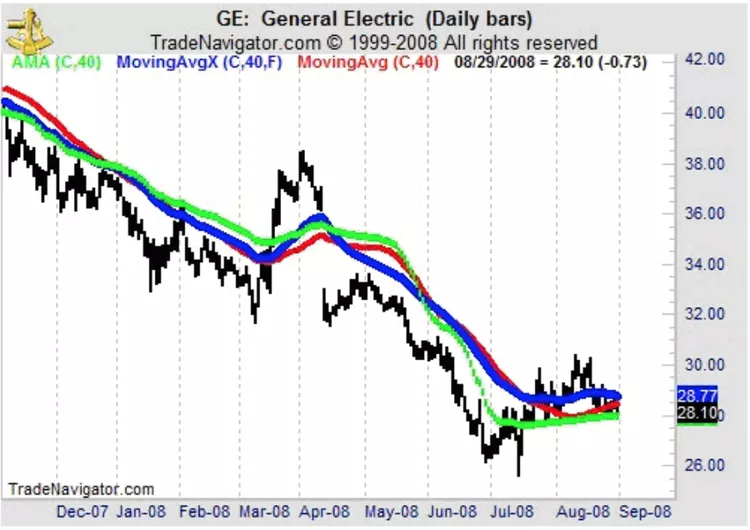

The AMA is in green and shows the greatest degree of flattening in the range-bound action seen on the right side of this chart. In most cases, the exponential moving average, shown as the blue line, is closest to the price action. The simple moving average is shown as the red line.

In [47]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [48]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
2038,2017-11-06,23.30,23.65,23.20,20.576223,432347,0,echo,52.631579,432347,...,42.561765,22.7125,22.3875,17.2375,16.150,0.0,-74.559689,250573.0,2807621.0,19.615222
2039,2017-11-07,23.50,24.10,23.50,20.796174,603288,0,echo,53.738318,603288,...,49.674663,24.2875,22.3875,17.3750,16.250,0.0,-71.577301,250573.0,2807621.0,20.140090
2040,2017-11-08,23.75,24.15,23.30,21.007327,977417,0,echo,63.878327,977417,...,50.251776,23.7250,22.3875,17.6000,16.250,0.0,-73.179392,250573.0,2807621.0,20.525529
2041,2017-11-09,23.95,24.15,23.45,21.210034,363013,0,echo,69.952305,363013,...,50.786693,23.7750,22.3875,17.6375,16.275,0.0,-71.807616,250573.0,2807621.0,20.829753
2042,2017-11-10,23.70,23.95,23.70,21.404633,423186,0,echo,68.965517,423186,...,51.320464,23.7750,22.3875,17.8250,16.300,0.0,-69.447842,250573.0,2807621.0,21.085255


# Drop Unwanted Columns

In [49]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-25,10.989,11.358,10.946,11.331,35111,0,glv,0.0,35111,...,0.0,0.0,0.0,0.0,0.0,10.958345,0.0,0.0,0.0,0.0
1,2005-02-28,11.331,11.378,11.146,11.227,30760,0,glv,0.0,30760,...,0.0,0.0,0.0,0.0,0.0,10.814377,0.0,0.0,0.0,0.0
2,2005-03-01,11.227,11.551,10.971,11.358,120983,0,glv,0.0,120983,...,0.0,0.0,0.0,0.0,0.0,10.690564,0.0,0.0,0.0,0.0
3,2005-03-02,11.551,11.551,11.196,10.971,92484,0,glv,0.0,92484,...,0.0,0.0,0.0,0.0,0.0,10.607000,0.0,0.0,0.0,0.0
4,2005-03-03,11.190,11.190,11.067,10.971,61534,0,glv,0.0,61534,...,0.0,0.0,0.0,0.0,0.0,10.607000,0.0,0.0,0.0,0.0


# Data Visualization Of Technical Indicators

In [50]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2011-08-26,22.435,22.497,20.752,20.863000,580609,0,kmpr,0.0,580609,...,0.0,0.0,0.0,0.0,0.0,22.163900,0.0,0.0,0.0,0.0
1,2011-08-29,21.023,22.109,20.947,22.109000,207974,0,kmpr,0.0,207974,...,0.0,0.0,0.0,0.0,0.0,22.038584,0.0,0.0,0.0,0.0
2,2011-08-30,21.948,22.007,21.441,22.497000,175115,0,kmpr,0.0,175115,...,0.0,0.0,0.0,0.0,0.0,21.918280,0.0,0.0,0.0,0.0
3,2011-08-31,21.943,22.185,21.692,22.475880,210105,0,kmpr,0.0,210105,...,0.0,0.0,0.0,0.0,0.0,21.802789,0.0,0.0,0.0,0.0
4,2011-09-01,21.989,22.109,21.374,22.455182,119507,0,kmpr,0.0,119507,...,0.0,0.0,0.0,0.0,0.0,21.691918,0.0,0.0,0.0,0.0


In [51]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)

In [52]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2011-08-26,22.435,22.497,20.752,20.863000,580609,0,kmpr,0.0,580609,0.0,...,0.0,0.0,0.0,0.0,0.0,22.163900,0.0,0.0,0.0,0.0
2011-08-29,21.023,22.109,20.947,22.109000,207974,0,kmpr,0.0,207974,0.0,...,0.0,0.0,0.0,0.0,0.0,22.038584,0.0,0.0,0.0,0.0
2011-08-30,21.948,22.007,21.441,22.497000,175115,0,kmpr,0.0,175115,0.0,...,0.0,0.0,0.0,0.0,0.0,21.918280,0.0,0.0,0.0,0.0
2011-08-31,21.943,22.185,21.692,22.475880,210105,0,kmpr,0.0,210105,0.0,...,0.0,0.0,0.0,0.0,0.0,21.802789,0.0,0.0,0.0,0.0
2011-09-01,21.989,22.109,21.374,22.455182,119507,0,kmpr,0.0,119507,0.0,...,0.0,0.0,0.0,0.0,0.0,21.691918,0.0,0.0,0.0,0.0


In [53]:
%matplotlib inline

# RSI Plot

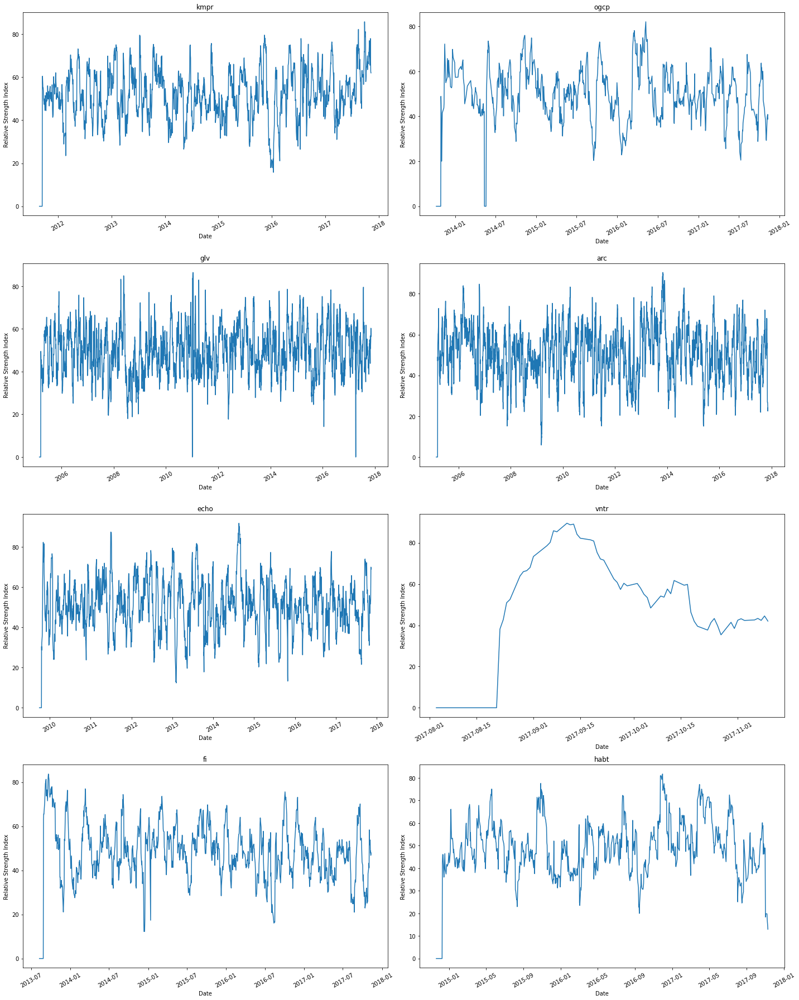

In [54]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()

# Volume Plain plot

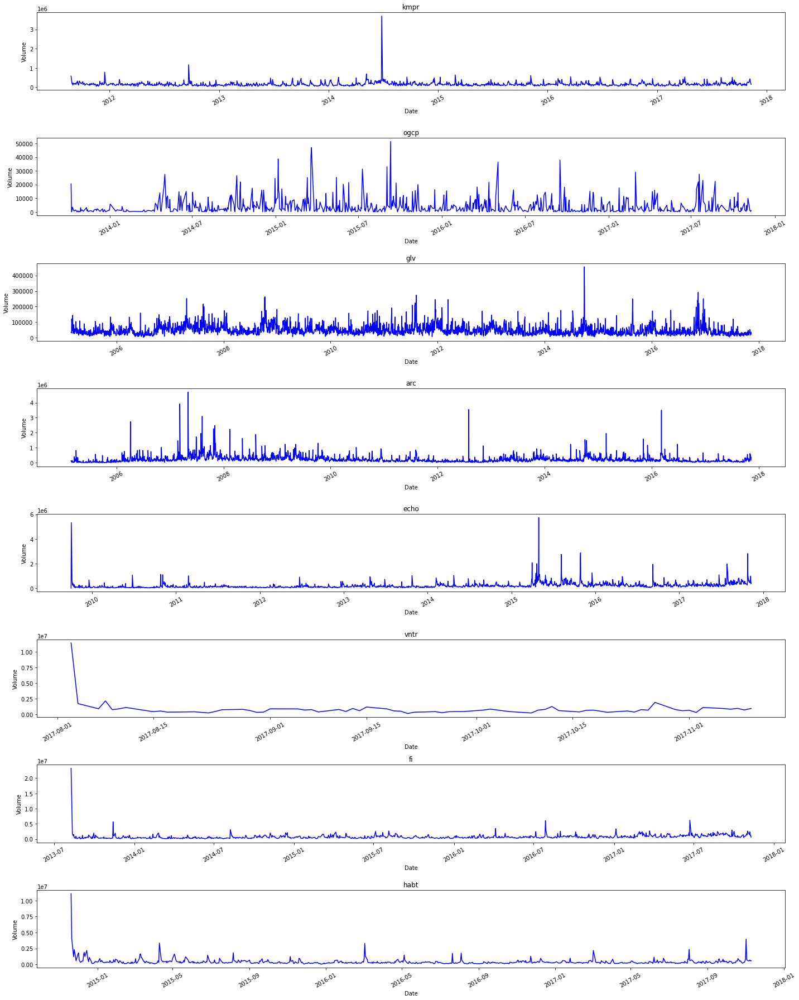

In [55]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

# Bolinger Bands

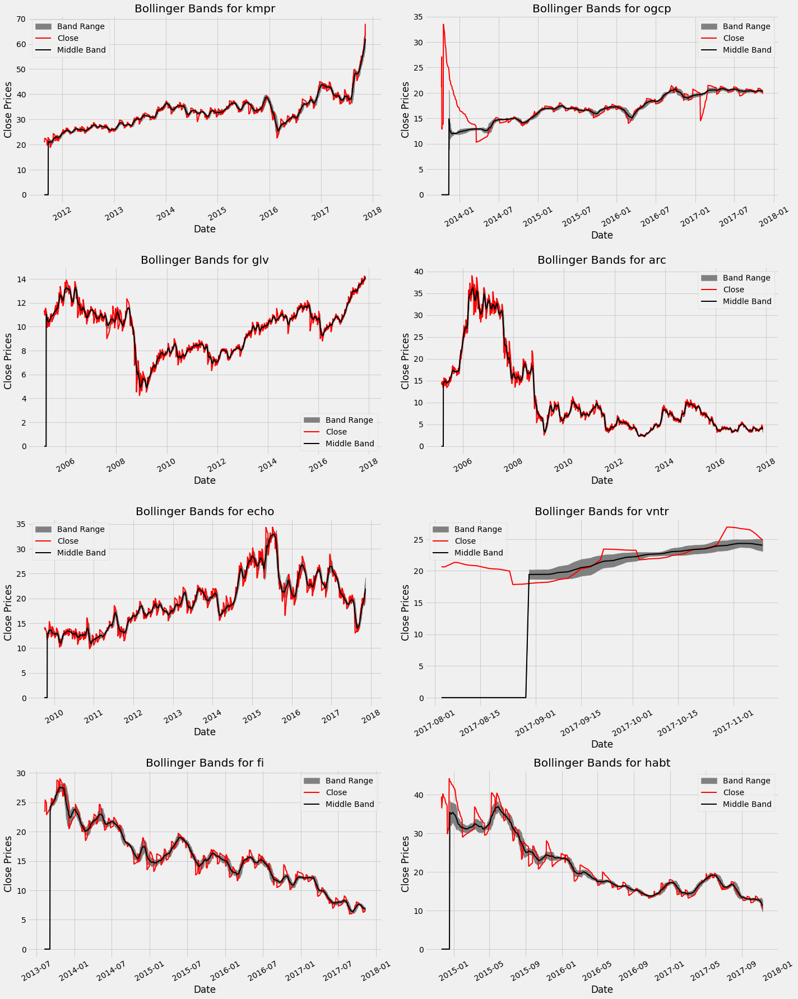

In [56]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

# Aroon Oscillator Plot

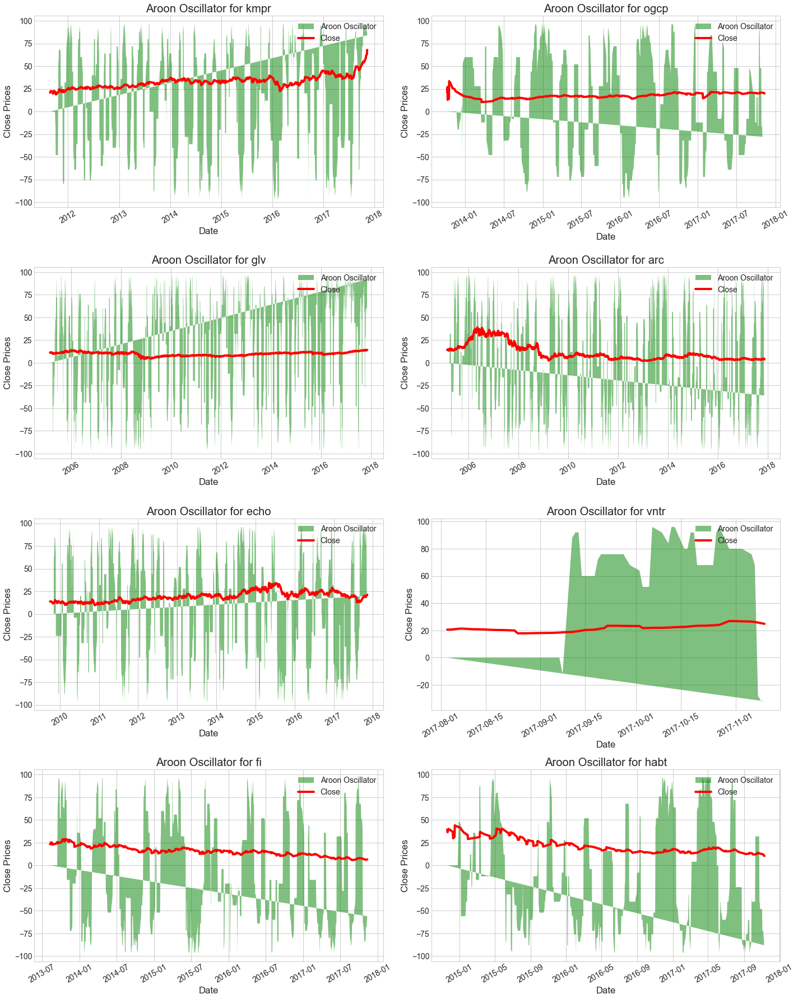

In [57]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

# Price Volume Trend Plot

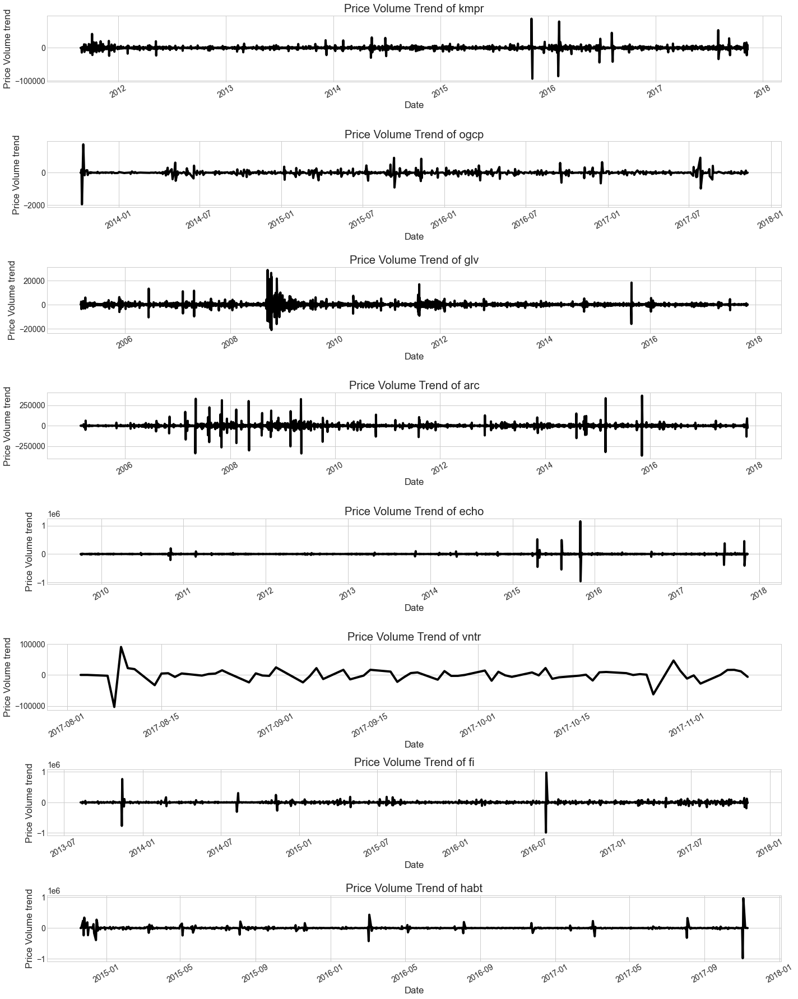

In [58]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

# Acceleration band Plot

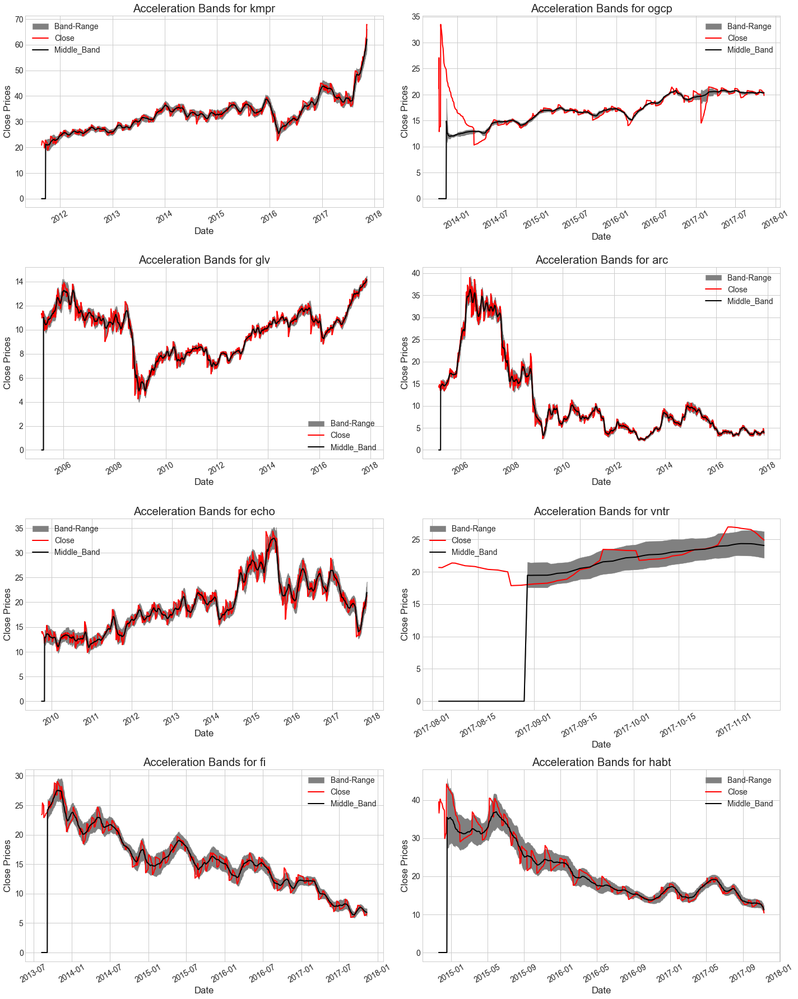

In [59]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

# Stochastic Oscillator plots

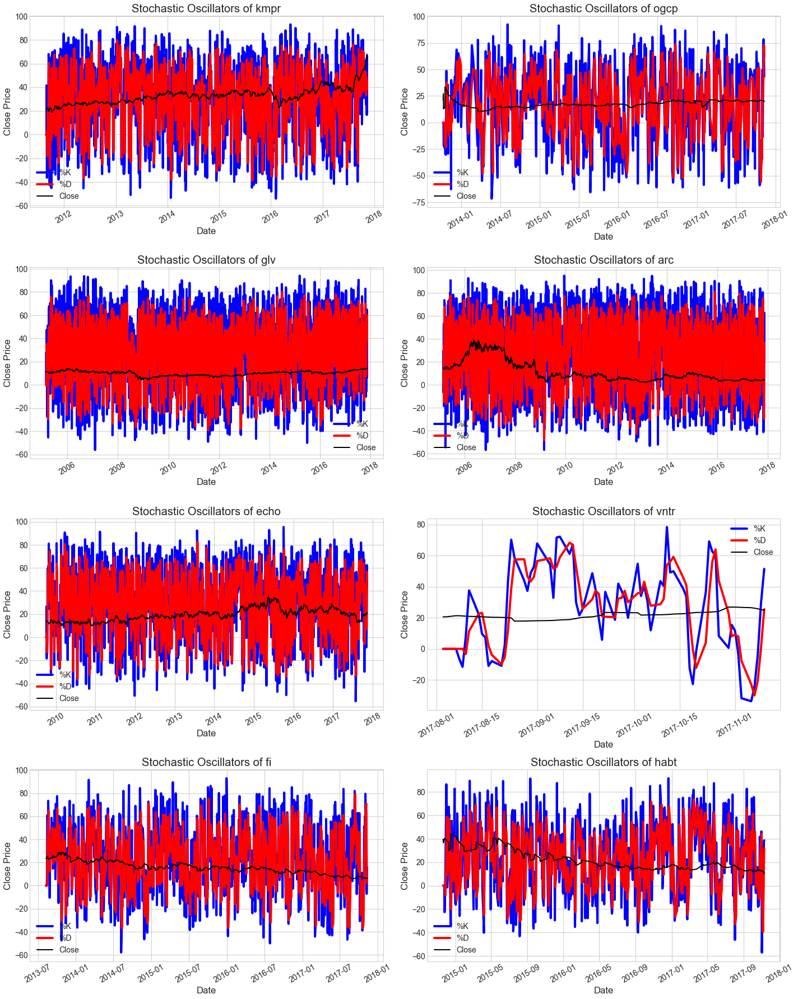

In [60]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

# Chaikin Money Flow Plots

C:\Users\Paras\AppData\Local\Temp\ipykernel_23060\439006793.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


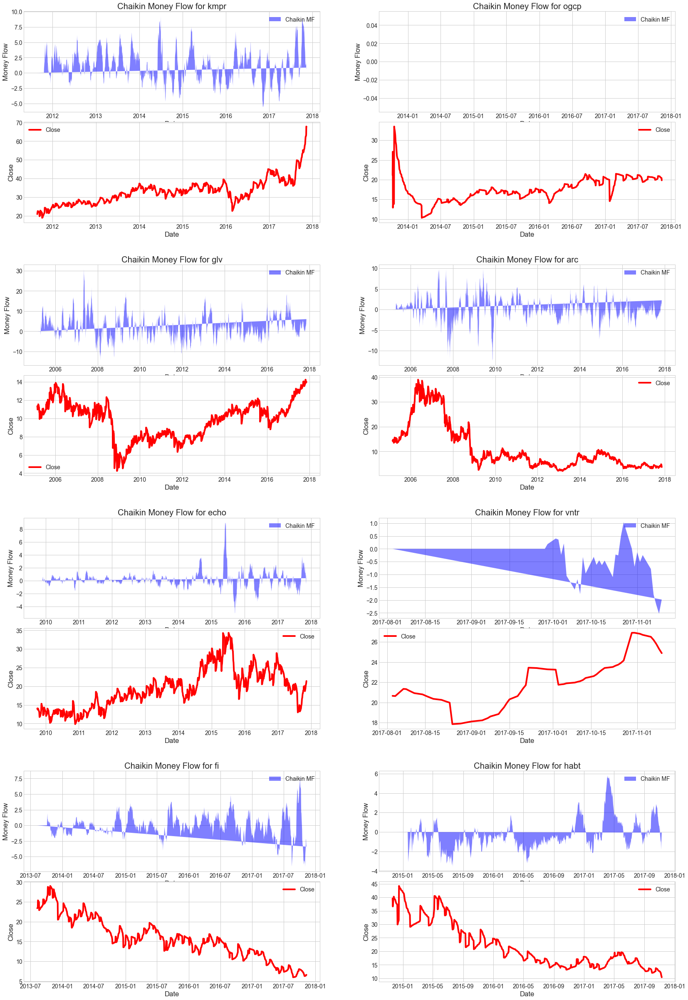

In [61]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

# Parabolic SAR, Rate of Change, Momentum and VWAP Plots

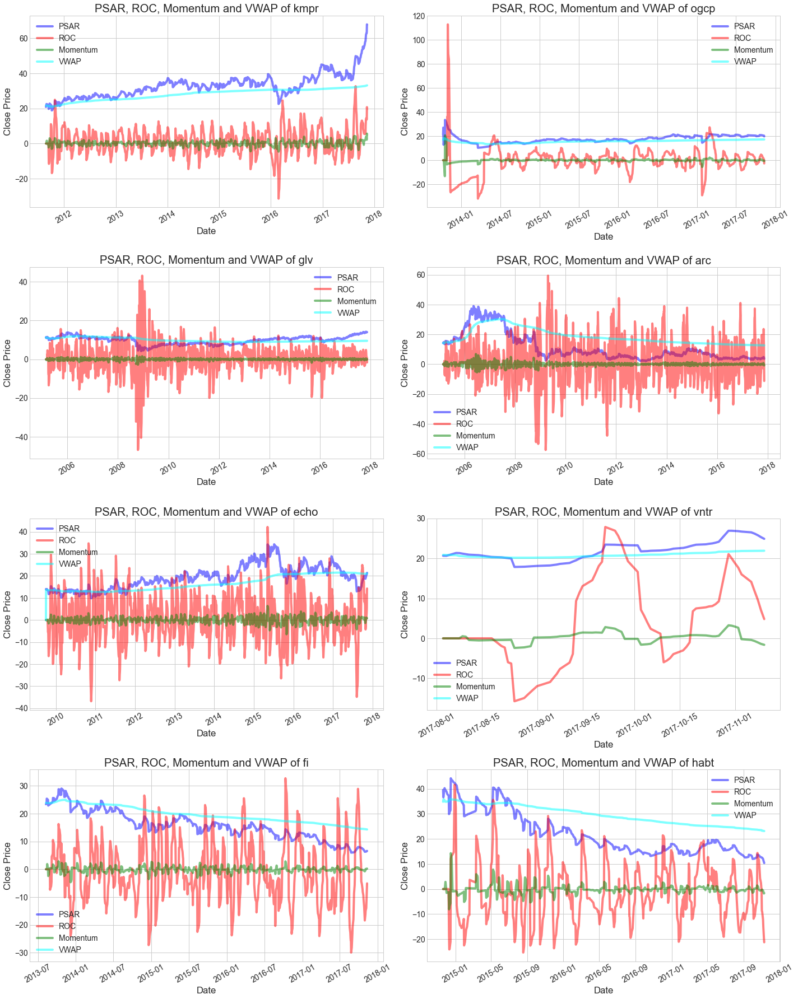

In [62]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

C:\Users\Paras\AppData\Local\Temp\ipykernel_23060\1835677713.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


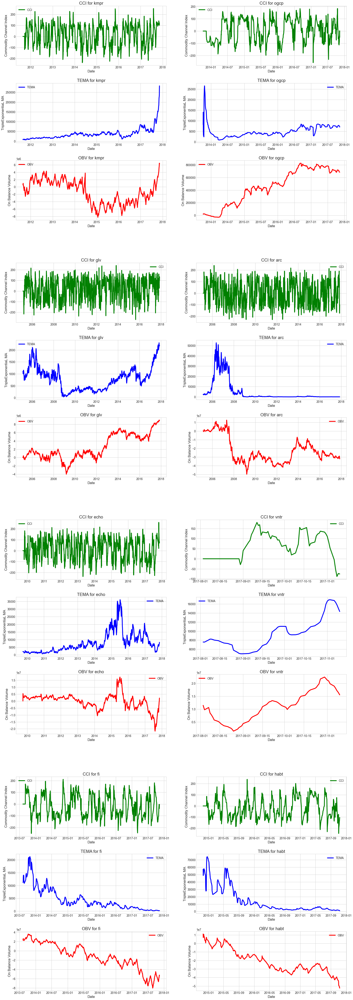

In [63]:
fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

# Normalized Average True range Plots

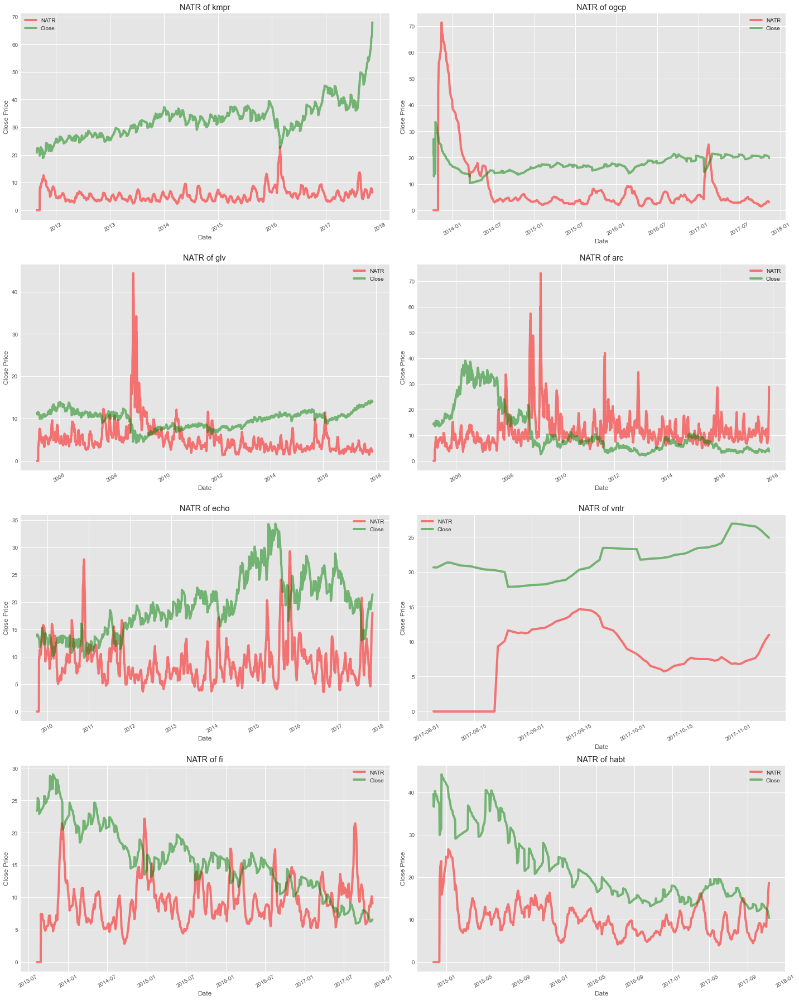

In [64]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'green', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

# Keltner Channels Plots

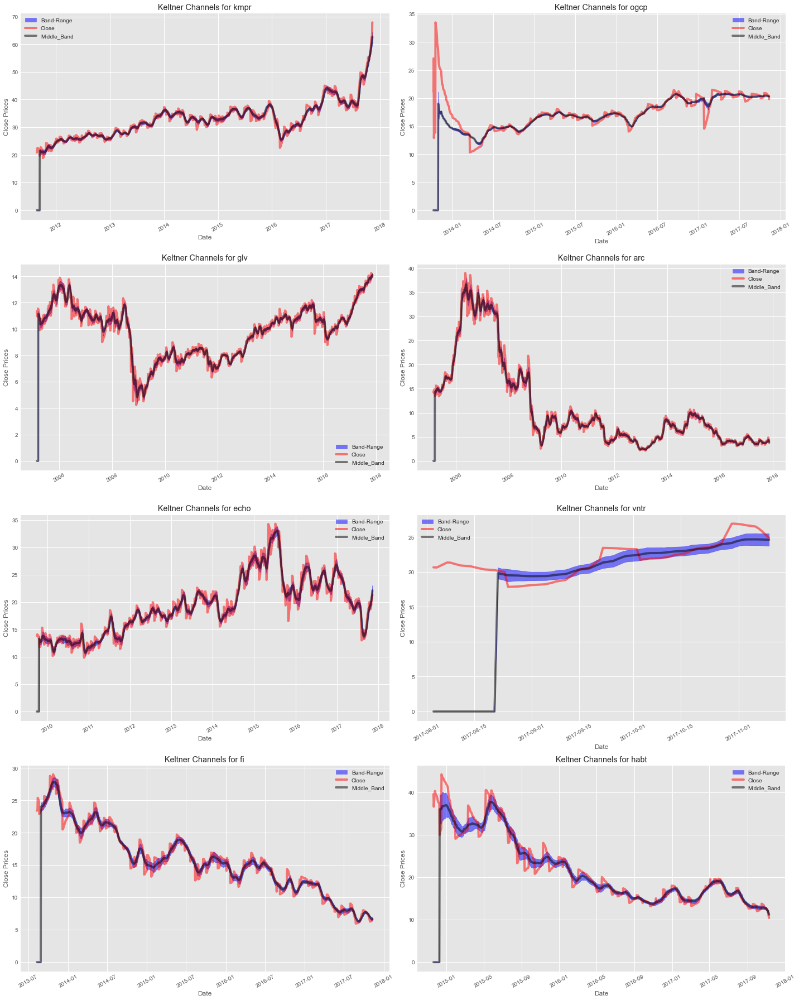

In [65]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

# Average Directional Index

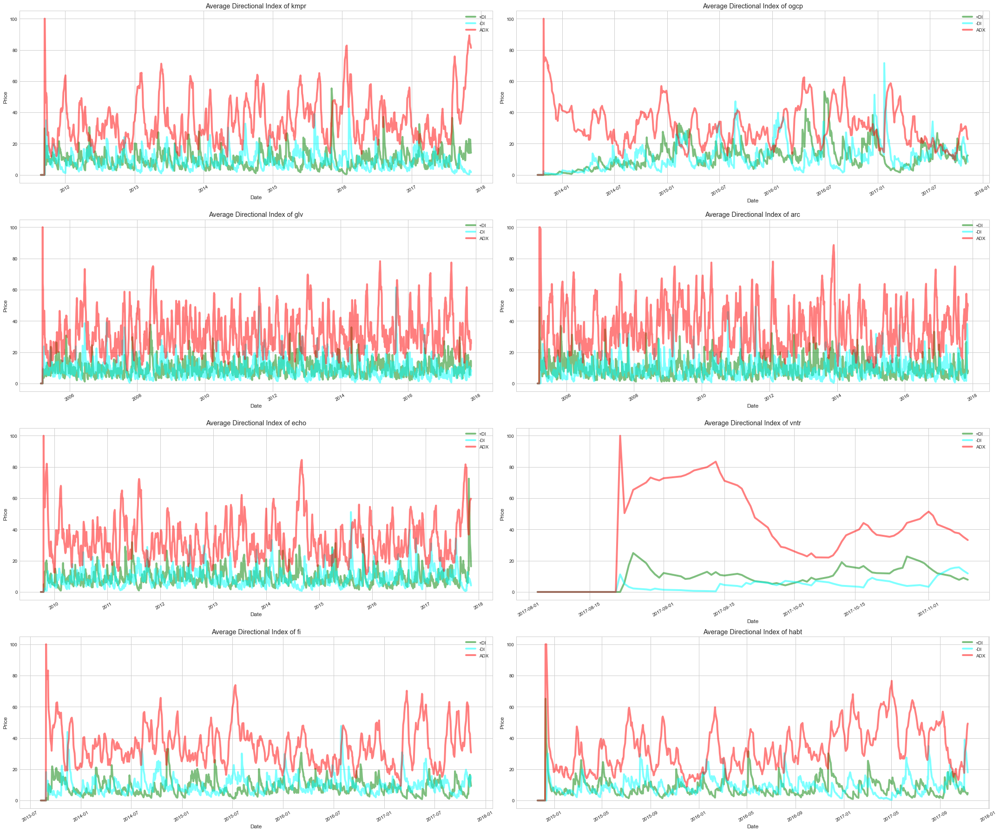

In [66]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots

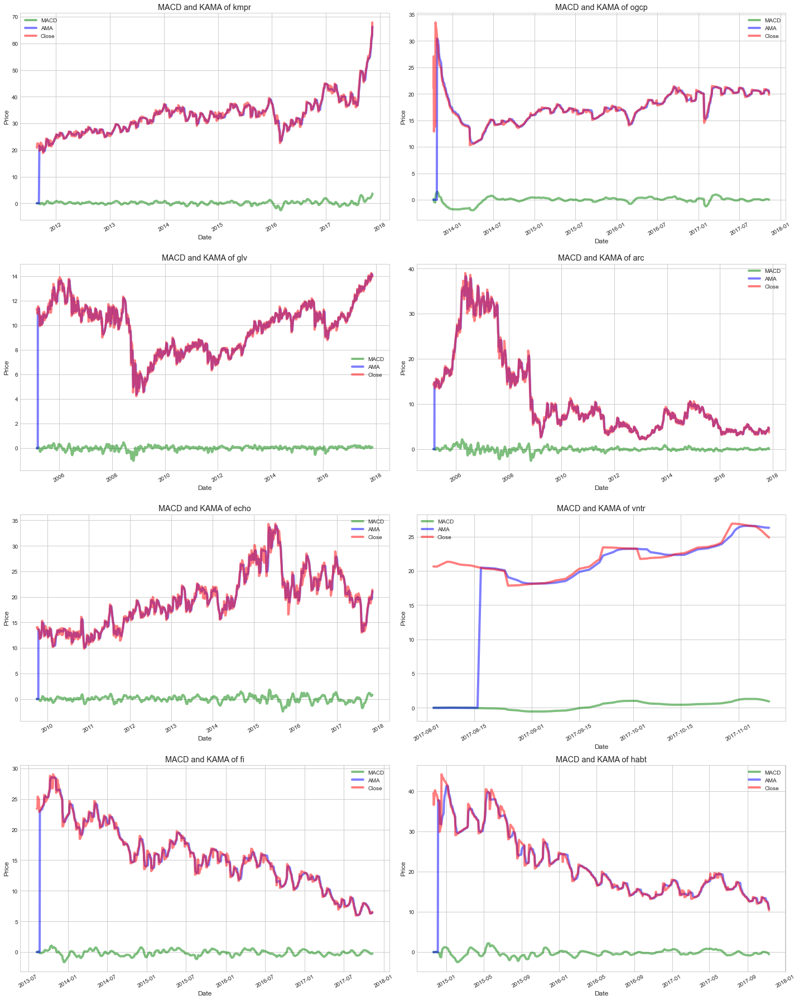

In [67]:
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

# William %R, Money Flow

C:\Users\Paras\AppData\Local\Temp\ipykernel_23060\1542051369.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


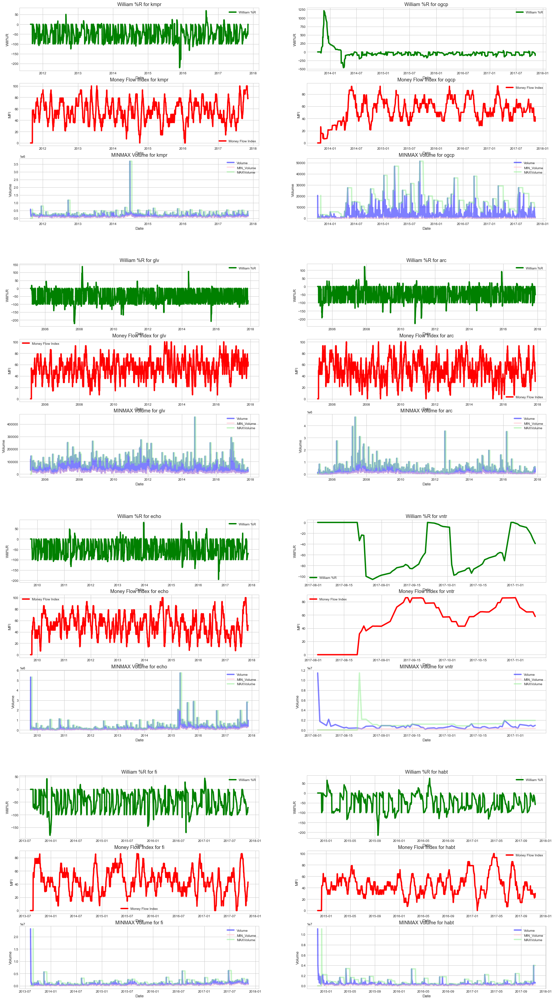

In [68]:
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

# ichimoku Plots , turning line	, standard line	, ichimoku span1 , ichimoku span2 ,	chikou span


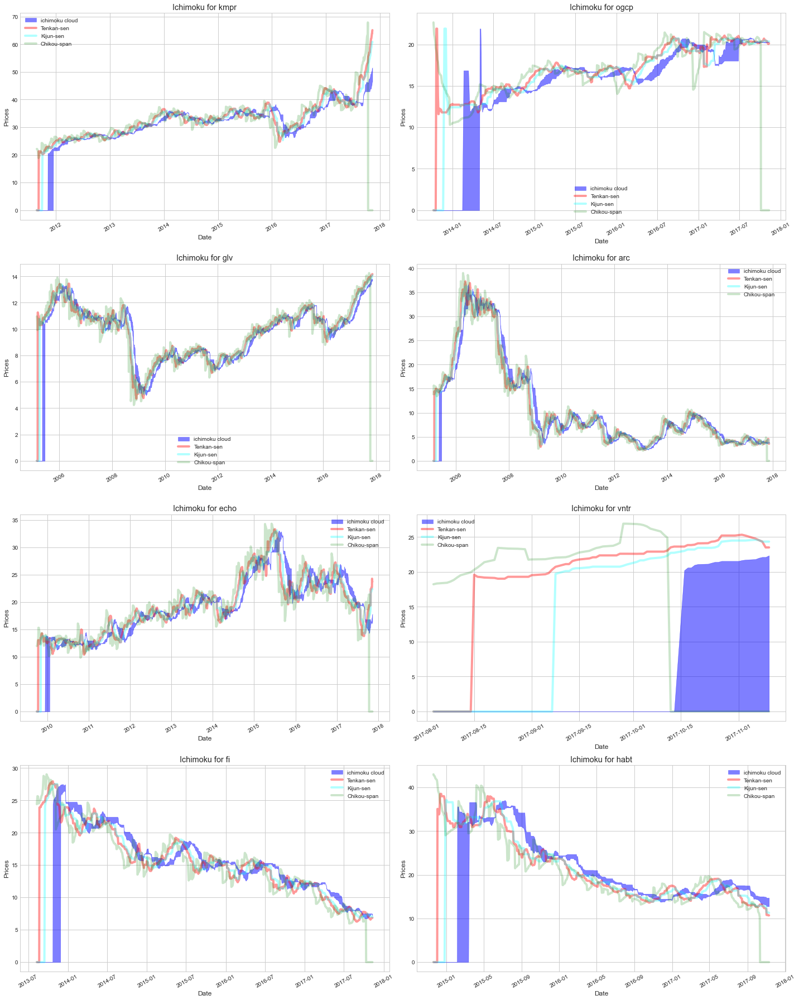

In [69]:
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()